# tSNE visualization working script

Yao Fu. University of Edinburgh\
yao.fu@ed.ac.uk\
Tue Jun 22 2021

In [1]:
import torch 
import sklearn

import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from pandas import DataFrame

from collections import Counter
from tqdm import tqdm 
from data_utils import News20Data
from transformers import BertModel, BertTokenizer
from nltk.corpus import stopwords
from matplotlib.pyplot import figure
from matplotlib import collections as mc
from matplotlib.colors import ListedColormap

In [2]:
STOPWORDS = stopwords.words('english')
STOPWORDS.extend(['"', "'", '.', ',', '?', '!', '-', '[CLS]', '[SEP]', '[PAD]',
  ':', '@', '/', '[', ']', '(', ')', 'would', 'like'])
STOPWORDS = set(STOPWORDS)

## Dataset

In [3]:
batch_size=20
dataset = News20Data(batch_size=batch_size)

Processing dataset ...
Reading data ...
... 0 seconds
Tokenizing and sorting train data ...
... 111 seconds
Tokenizing and sorting dev data ...
... 37 seconds
Tokenizing and sorting test data ...
... 37 seconds


## Model

In [4]:
bert = BertModel.from_pretrained('bert-base-uncased')
bert.to('cuda')
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertModel: ['cls.predictions.transform.dense.weight', 'cls.predictions.transform.dense.bias', 'cls.seq_relationship.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.bias', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.decoder.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


## States, Frequency, How dynamic a state is 

In [5]:
ckpt_path = '../models/bertnet_0.0.4.10.3/e9-model.pt'
ckpt = torch.load(ckpt_path)
state_matrix = ckpt['state_matrix']
state_matrix_py = state_matrix.cpu().numpy()

In [6]:
def read_state_freq(path):
    state_freq = np.zeros(2000)
    state_nonstop_freq = np.zeros(2000)
    with open(path) as fd:
        lines = fd.readlines()
        for li, l in enumerate(lines):
            if(li % 3 == 0):
                l = l.split()
                state_id = int(l[1])
                state_freq[state_id] = int(l[3])
                state_nonstop_freq[state_id] = int(l[5])
    return state_freq, state_nonstop_freq

In [7]:
state_freq, state_nonstop_freq = read_state_freq('/home/s1946695/Scale-CRF-Latent-Space/outputs/bertnet_0.0.4.10.3/bertnet_dev_epoch_9_s2w.txt')

In [83]:
state_freq[138]

10134.0

In [8]:
state_freq_norm = np.log(state_freq)
state_freq_norm = state_freq_norm - state_freq_norm.min()
state_freq_norm = state_freq_norm / state_freq_norm.max()

In [9]:
state_nonstop_freq_r = state_nonstop_freq / state_freq

In [129]:
freq_idx_sort = state_freq.argsort()[::-1]
freq_idx_inverse = {}
for i, j in enumerate(freq_idx_sort):
    freq_idx_inverse[j] = i
state_stop_freq = state_freq - state_nonstop_freq

## State bigram statistics

In [104]:
def read_state_bigram(path):
    bigrams = []
    with open(path) as fd:
        lines = fd.readlines()
        for l in lines:
            if(l.startswith('state')):
                from_state, to_state = map(int, l.split()[2].split('-'))
                freq = int(l.split()[4])
                bigrams.append([from_state, to_state, freq])
    freq_norm = np.log(np.array([b[2] for b in bigrams]))
    freq_norm = freq_norm - freq_norm.mean()
    freq_norm = freq_norm - freq_norm.min()
    freq_norm /= freq_norm.max()
    for bi, fn in zip(bigrams, freq_norm):
        bi.append(fn)
    return bigrams

In [110]:
state_bigrams = read_state_bigram('/home/s1946695/Scale-CRF-Latent-Space/outputs/bertnet_0.0.4.10.3/bertnet_dev_epoch_9_state_2gram_no_sw.txt')

## Word Frequency

In [567]:
train_loader = dataset.train_dataloader()

In [579]:
all_tokens = []
for bi, batch in tqdm(enumerate(train_loader)):
    for bi_id in batch['input_ids']:
        t = tokenizer.convert_ids_to_tokens(bi_id)
        all_tokens.extend(t)
word_freq = Counter(all_tokens)

words_ = []
word_freq_norm = []
for wi, wf in word_freq.most_common():
    if(wi not in ['[CLS]', '[SEP]', '[PAD]']):
        words_.append(wi)
        word_freq_norm.append(np.log(wf))
word_freq_norm = np.array(word_freq_norm)
word_freq_norm -= word_freq_norm.min()
word_freq_norm += 0.1
word_freq_norm /= word_freq_norm.max()

word_freq_norm = {wi: wf for wi, wf in zip(words_, word_freq_norm)}

7837it [00:52, 148.68it/s]


## Word state frequency

In [705]:
word_state_freq = {}
with open('/home/s1946695/Scale-CRF-Latent-Space/outputs/bertnet_0.0.4.10.3/bertnet_dev_epoch_9_s2w.txt') as fd:
    for l in fd:
        if l.startswith('state'):
            current_state = l.split()[1]
        else:
            words = l[:-4].split(' | ')
            for w in words:
                w = w.split(' ')[0]
                if(w in word_state_freq): 
                    if(current_state not in word_state_freq[w]): word_state_freq[w].append(current_state)
                else: word_state_freq[w] = [current_state]

words_ = []
freq_ = []
for w in word_state_freq: 
    words_.append(w)
    freq_.append(len(word_state_freq[w]))
freq_ = np.log(np.array(freq_))
freq_ = freq_ - freq_.min() + 0.1
freq_ /= freq_.max()

word_state_freq_norm = {w: f for w, f in zip(words_, freq_)}

In [706]:
len(word_state_freq_norm)

9269

## Embeddings

In [11]:
dev_loader = dataset.val_dataloader()

In [12]:
len(dev_loader)

2612

In [13]:
embeddings = []
tokens = []
# TODO: implement indexing
id2word = {}
wordid2sentid = {}
with torch.no_grad():
    for bi, batch in tqdm(enumerate(dev_loader)):
        if(bi == 500): break
        emb = bert(batch['input_ids'].to('cuda'), batch['attention_mask'].to('cuda'))[0]
        for bij, bi_id in enumerate(batch['input_ids']):
            t = tokenizer.convert_ids_to_tokens(bi_id)
            tokens_len = len(tokens)
            for word_id, tij in enumerate(t):
                word_id = tokens_len + word_id
                id2word[word_id] = tij
                wordid2sentid[word_id] = bi * batch_size + bij
            tokens.extend(t)
        embeddings.append(emb.view(-1, 768))

500it [00:11, 42.43it/s]


In [14]:
with torch.no_grad():
    embeddings = torch.cat(embeddings, 0).view(-1, 768)
    embeddings_total = torch.cat([state_matrix, embeddings], 0)

## State-word, State-state Distance Matrix

In [535]:
with torch.no_grad():
    sim_word_state = torch.matmul(embeddings, state_matrix.transpose(0, 1))
    sim_state_state = torch.matmul(state_matrix, state_matrix.transpose(0, 1))
    state_links = sim_state_state.argmax(dim=-1).cpu().numpy()
#     sim_word_state = sim_word_state.cpu().numpy()
#     sim_state_state = sim_state_state.cpu().numpy()

In [737]:
sim_state_state.max(), sim_state_state.min(), sim_state_state.mean()

(tensor(62.1664, device='cuda:0'),
 tensor(-6.1972, device='cuda:0'),
 tensor(1.9241, device='cuda:0'))

In [738]:
sim_word_state.max(), sim_word_state.min(), sim_word_state.mean()

(tensor(10.6596, device='cuda:0'),
 tensor(-26.9500, device='cuda:0'),
 tensor(1.3627, device='cuda:0'))

In [251]:
state_bigram_dot_prod = []
for i, sl in enumerate(state_links):
    state_bigram_dot_prod.append([i, sl, sim_state_state[i, sl]])
    
sim_bigram_norm = np.array([bi[-1] for bi in state_bigram_dot_prod])
sim_bigram_norm = sim_bigram_norm - sim_bigram_norm.min() + 0.01
sim_bigram_norm = sim_bigram_norm / sim_bigram_norm.max()
for bi, sb in zip(state_bigram_dot_prod, sim_bigram_norm):
    bi[-1] = sb

In [79]:
sim_state_state[0][sim_state_state[0].argsort()]

tensor([-0.4405, -0.3110, -0.2670,  ...,  4.1374,  5.0872,  5.4960],
       device='cuda:0')

In [549]:
def query_sim_words(state_id, sim_word_state, id2word, wordid2sentid, thres=3, k=2000):
    """Query similar words of a given state"""
    K = 50000
    torch.cuda.empty_cache()
    
    sim_words = []
    sim_words_in_sents = []
    _, sim_word_idx = sim_word_state[:, state_id].topk(K)
    for wi in sim_word_idx:
        wi = wi.item()
        w = id2word[wi]
        if(w in STOPWORDS): continue
        sim_words.append(w)
        sim_words_in_sents.append(wordid2sentid[wi])
        if(len(sim_words) == k): break
    sim_words_set = Counter(sim_words)
    sim_words_set_ = dict()
    for w, c in sim_words_set.most_common():
        if(c > thres):
            sim_words_set_[w] = c
    return sim_word_idx.cpu().numpy(), sim_words, sim_words_set_, sim_words_in_sents

In [559]:
sim_word_idx, sim_words, sim_words_set, sim_words_in_sents = query_sim_words(1279, sim_word_state, id2word, wordid2sentid, k=1000)
print(sim_words_set)

{'advance': 36, 'ed': 28, '##d': 20, 'survivors': 17, '##ed': 13, 'appreciated': 13, 'd': 11, 'organization': 8, 'regards': 8, 'intended': 7, 'failed': 7, 'unknown': 6, 'got': 6, 'used': 6, 'di': 6, 'included': 6, 'said': 5, 'killed': 5, 'supported': 5, 'left': 5, 'done': 5, 'steve': 5, 'attributed': 4, 'based': 4, 'made': 4, 'agreed': 4, 'public': 4, 'boulder': 4, 'bt': 4, 'fixed': 4, 'dortmund': 4, 'green': 4, 'dod': 4, 'need': 4, 'hunter': 4, 'essen': 4, 'planting': 4, 'anders': 4}


In [555]:
sim_word_idx, sim_words, sim_words_set, sim_words_in_sents = query_sim_words(138, sim_word_state, id2word, wordid2sentid, k=1000)
print(sim_words_set)

{'un': 23, 'mark': 17, 'princeton': 16, 'ac': 13, 'keith': 11, 'opinions': 9, '##sta': 9, 'joe': 9, 'mathew': 8, 'second': 8, 'u': 7, 'stephan': 7, 'two': 7, 'advance': 7, 'yu': 7, '1': 6, 'valentine': 6, ';': 6, 'scott': 6, 'pat': 6, 'dan': 6, 'steve': 6, 'first': 5, 'chen': 5, 'anyone': 5, 'med': 5, 'thanks': 5, 'al': 4, '0': 4, 'regards': 4, 'rich': 4, 'gregg': 4, 'l': 4, 'eric': 4, 'chris': 4, 'essen': 4, 'lines': 4, 'brian': 4, 'organization': 4, 'jesus': 4, 'fisher': 4, '2': 4, 'cares': 4, 'maybe': 4, '100': 4, 'one': 4, 'hannibal': 4, 'murdoch': 4, 'd': 4, 'subject': 4, 'aaron': 4, 'holland': 4, 'boulder': 4, 'andy': 4, 'bedford': 4}


In [556]:
sim_word_idx, sim_words, sim_words_set, sim_words_in_sents = query_sim_words(freq_idx_sort[500], sim_word_state, id2word, wordid2sentid, k=1000)
print(sim_words_set)

{'6': 21, 'ed': 19, 'un': 18, 'mark': 16, 'di': 16, '_': 16, 'princeton': 16, 'p': 15, '7': 15, 'ac': 13, 'stephan': 12, 'hmm': 11, 'keith': 11, 'joe': 10, ';': 9, 'u': 9, 'steve': 9, '##sta': 9, 'th': 8, '=': 8, 'z': 8, 'yu': 8, 'ms': 8, 'mathew': 7, 'g': 7, 'pat': 7, '\\': 7, 'phil': 6, 'crypt': 6, 'pp': 6, '#': 6, 'harry': 6, 'scott': 6, 'dan': 6, 'valentine': 6, 'cf': 5, 'yo': 5, '100': 5, 'computer': 5, 'gregg': 5, 'thanks': 5, 'hu': 5, 'gerald': 5, 'rich': 4, '0': 4, '80': 4, 'd': 4, 'chris': 4, 'dave': 4, 'bt': 4, 'je': 4, 'aaron': 4, 'randy': 4, 'na': 4, 'y': 4, 'nothing': 4, 'brian': 4, 'n': 4, 'maybe': 4, 'eric': 4, 'essen': 4, 'perhaps': 4, '2': 4, '+': 4, 'com': 4, '##u': 4}


In [557]:
sim_word_idx, sim_words, sim_words_set, sim_words_in_sents = query_sim_words(freq_idx_sort[1000], sim_word_state, id2word, wordid2sentid, k=1000)
print(sim_words_set)

{'5': 31, '6': 21, 'un': 18, '7': 17, 'p': 16, 'princeton': 16, 'di': 15, 'jon': 14, 'ac': 14, 'keith': 11, 'hmm': 10, 'joe': 10, '8': 10, ';': 9, 'stephan': 9, 'pat': 8, 'u': 8, 'steve': 8, 'yo': 7, '#': 7, 'ed': 7, 'phil': 6, 'z': 6, 'mathew': 6, 'gregg': 6, 'g': 6, 'pp': 6, 'scott': 6, '\\': 6, 'valentine': 6, 'st': 5, 'chris': 5, 'bt': 5, 'j': 5, 'computer': 5, 'crypt': 5, 'gerald': 5, 'o': 5, '2': 5, 'doug': 5, 'dan': 5, 'mike': 5, 'th': 4, 'na': 4, 'nothing': 4, '100': 4, 'dave': 4, 'matt': 4, '0': 4, 'n': 4, 'aaron': 4, 'randy': 4, 'brian': 4, 'sanders': 4, 'y': 4, 'rich': 4, '##u': 4, 'ab': 4}


In [558]:
sim_word_idx, sim_words, sim_words_set, sim_words_in_sents = query_sim_words(freq_idx_sort[1500], sim_word_state, id2word, wordid2sentid, k=1000)
print(sim_words_set)

{'thanks': 38, '5': 33, '6': 21, 'di': 16, 'princeton': 16, 'un': 16, 'mormon': 16, 'sci': 14, 'p': 13, 'ac': 13, 'stephan': 13, '7': 13, '2': 12, 'ed': 12, '8': 12, '_': 12, 'hmm': 11, 'keith': 11, '#': 10, 'pp': 9, 'u': 9, ';': 8, '\\': 8, 'joe': 8, 'steve': 8, '##sta': 8, 'pat': 7, 'phil': 6, 'mathew': 6, 'z': 6, 'g': 6, '9': 6, 'scott': 6, 'valentine': 6, 'yo': 5, 'chris': 5, 'd': 5, 'thank': 5, 'gerald': 5, 'l': 4, '0': 4, 'th': 4, 'j': 4, 'bt': 4, 'nothing': 4, 'na': 4, '100': 4, 'du': 4, 'n': 4, '+': 4, '1': 4, 'randy': 4, 'matt': 4, 'y': 4, 'brian': 4, 'com': 4, '268': 4, 'please': 4, 'aaron': 4, 'hannibal': 4}


In [726]:
len(sim_words)

1000

## Preparations

In [734]:
def metric_fn(x1, x2):
    m = np.exp(-(x1 * x2).sum())
    return m

def tsne_transform_dot_prod(emb_matrix, perplexity, n_iter, topk):
    """Do tsne"""
    tsne = TSNE(n_components=2, verbose=2, perplexity=perplexity, n_iter=n_iter, metric=metric_fn)
    emb_transform = tsne.fit_transform(emb_matrix)
    
    emb_background = emb_transform[topk:]
    state_matrix_transform = emb_transform[: topk]
    return emb_background, state_matrix_transform

def tsne_preprocess(state_matrix, word_matrix):
    n_state = state_matrix.shape[0]
    emb_matrix = np.concatenate([state_matrix, word_matrix], 0)
    
    n_state = np.zeros((emb_matrix.shape[0], 1)) + n_state
    inx = np.reshape(np.arange(emb_matrix.shape[0]), [emb_matrix.shape[0], 1])
    emb_matrix = np.concatenate([n_state, inx, emb_matrix], 1)
    return emb_matrix

def metric_fn_no_state(x1, x2):
    n_state = x1[0]
    x1_id = x1[1]
    x2_id = x2[1]
    if(x1_id < n_state and x2_id < n_state): 
        m = 100
    else:
        m = np.exp(-(x1[2:] * x2[2:]).sum())
    return m

def get_word_sample_freq(sample_idx, word_freq_norm, id2word, emb_non_stop_ids):
    word_sample_freq = []
    impute_cnt_ = 0
    for si in tqdm(sample_idx):
        si_word = id2word[emb_non_stop_ids[si]]
        if(si_word in word_freq_norm):
            word_sample_freq.append(word_freq_norm[si_word])
        else:
            word_sample_freq.append(0.5)
            impute_cnt_ += 1
    print(impute_cnt_)
    return np.array(word_sample_freq)

def tsne_transform_dot_prod_no_state(emb_matrix, perplexity, n_iter, topk):
    """Do tsne"""
    tsne = TSNE(n_components=2, verbose=2, perplexity=perplexity, n_iter=n_iter, metric=metric_fn_no_state)
    emb_transform = tsne.fit_transform(emb_matrix)
    
    emb_background = emb_transform[topk:]
    state_matrix_transform = emb_transform[: topk]
    return emb_background, state_matrix_transform

def plot_words(emb_background, word_sample_freq):
    sns.set(rc={'figure.figsize':(8,6), 'figure.dpi': 200})
    plt.rcParams["font.size"] = 3
    
    # NOTE: the constrained_layout keyword is extremely important. If not set then later the location='top' will encounter error
    fig, axs = plt.subplots(1, 1, constrained_layout=True) 
    pcm = axs.scatter(x=emb_background_perp_5[:, 0], y=emb_background_perp_5[:, 1], s=1, c=word_sample_freq, cmap='coolwarm', linewidths=0, marker='D')
    cb = fig.colorbar(pcm, ax=axs, shrink=0.6, location='top')
    return 

def build_state_word_list(query_states, freq_idx_sort, sim_word_state, id2word, wordid2sentid, emb_non_stop_ids, sample_idx):
    original_idx_to_sorted_idx = {}
    for new_id, prev_id in enumerate(freq_idx_sort):
        original_idx_to_sorted_idx[prev_id] = new_id
    new_state_idx = [original_idx_to_sorted_idx[idx] for idx in query_states]
    
    original_word_idx_to_non_stop_idx = {}
    for new_id, prev_id in enumerate(emb_non_stop_ids):
        original_word_idx_to_non_stop_idx[prev_id] = new_id
        
    non_stop_idx_to_sampled_idx = {}
    for new_id, prev_id in enumerate(sample_idx):
        non_stop_idx_to_sampled_idx[prev_id] = new_id
        
    state_word_list = []
    for si in new_state_idx:
        sim_word_idx, sim_words, sim_words_set, sim_words_in_sents = query_sim_words(si, sim_word_state, id2word, wordid2sentid, thres=3, k=2000)
        sim_word_idx_ = sim_word_idx[:20]
        sim_word_idx_ = [original_word_idx_to_non_stop_idx[idx] for idx in sim_word_idx_]
        sim_word_idx_ = [non_stop_idx_to_sampled_idx[idx] for idx in sim_word_idx_]
        
        state_word_list.append([si, sim_word_idx_])
    return state_word_list

def plot_state_word_w_query(emb_background, 
                            state_matrix, 
                            state_nonstop_freq_r, 
                            state_freq_norm, 
                            word_sample_freq=None, 
                            word_only=False, 
                            state_size_base=1, 
                            filter_static=False, 
                            filter_contextualized=False,
                            state_word_list=None,
                            high_light_query=False
                            ):
    sns.set(rc={'figure.figsize':(8,6), 'figure.dpi': 200})
    plt.rcParams["font.size"] = 2
    
    fig, axs = plt.subplots(1, 1, constrained_layout=True) 

    s=1
    color = 'darkcyan'
    if(word_sample_freq is None):
        axs.scatter(x=emb_background[:, 0], y=emb_background[:, 1], s=s, color=color, linewidths=0, marker='D')
    else: 
        if(not high_light_query):
            pcm = axs.scatter(x=emb_background[:, 0], 
                        y=emb_background[:, 1], 
                        s=s,
                        c=1 - word_sample_freq,
                        cmap='coolwarm',
                        linewidths=0, 
                        marker='D')
            cbar = fig.colorbar(pcm, ax=axs, location='top', ticks=[0.4, 0.6, 0.8])
            cbar.ax.set_xticklabels(['More frequent', 'Intermediate', 'Less frequent'], fontsize=10) 
        else:
            axs.scatter(x=emb_background[:, 0], y=emb_background[:, 1], s=s, color=color, linewidths=0, marker='D', alpha=0.1)
            
        
    fig_all = plt.scatter(x=emb_background[0, 0], y=emb_background[0, 1], s=s, color=color, linewidths=0, marker='D')
    
    if(word_only == False):
        if(not high_light_query):
            if(filter_static):
                idx_ = np.where(state_nonstop_freq_r < 0.5)
                state_matrix = state_matrix[idx_]
                state_nonstop_freq_r = state_nonstop_freq_r[idx_]
                state_freq_norm = state_freq_norm[idx_]
            if(filter_contextualized):
                idx_ = np.where(state_nonstop_freq_r > 0.5)
                state_matrix = state_matrix[idx_]
                state_nonstop_freq_r = state_nonstop_freq_r[idx_]
                state_freq_norm = state_freq_norm[idx_]
            state_color = [0, 99, 204]
            state_edgecolor = np.array((state_color[0]/255., state_color[1]/255., state_color[2]/255., 1.))
            fig_state = plt.scatter(x=state_matrix[:, 0], 
                                    y=state_matrix[:, 1], 
                                    c=state_nonstop_freq_r, 
                                    cmap='Blues', 
                                    edgecolors='tab:grey', 
                                    s=state_size_base * np.exp(np.exp(state_freq_norm)) ** 2, 
                                    linewidths=0.3, 
                                    alpha=0.8
                                   )

            x_ticks = plt.xticks(fontsize=8)
            y_ticks = plt.yticks(fontsize=8)

            cbar = plt.colorbar(ticks=[0.2, 0.5, 0.8])
            cbar.ax.set_yticklabels(['Static', 'Intermediate', 'Contextualized'], verticalalignment='center', rotation=270, fontsize=10) 
        else:
            fig_state = plt.scatter(x=state_matrix[:, 0], 
                        y=state_matrix[:, 1], 
                        color='tab:blue',
                        edgecolors='tab:grey', 
                        s=state_size_base * np.exp(np.exp(state_freq_norm)) ** 2, 
                        linewidths=0.3, 
                        alpha=0.1
                       )
#         plt.legend((
#             fig_all, 
#             fig_state
#             ), (
#             'Words', 
#             'Latent states'
#             ), fontsize=10)
        
    if(state_word_list is not None):
        state_idx = [li[0] for li in state_word_list]
        state_queried = state_matrix[state_idx]
        state_queried_freq_norm = state_freq_norm[state_idx]
        state_queried_nonstop_freq_r = state_nonstop_freq_r[state_idx]
        
        fig_state_query = plt.scatter(x=state_queried[:, 0],
                                      y=state_queried[:, 1], 
                                      c=state_queried_nonstop_freq_r,
                                      cmap='Blue',
                                      edgecolors='tab:grey', 
                                      s=state_size_base * np.exp(np.exp(state_queried_freq_norm)) ** 2, 
                                      linewidths=0.3, 
                                      alpha=0.8
                                     )
        
        word_idx = []
        for li in state_word_list: word_idx.extend(li[1])
        emb_query_background = emb_background[word_idx]
        word_query_sample_freq = word_query_sample_freq[word_idx]
            
        pcm = axs.scatter(x=emb_query_background[:, 0], 
                          y=emb_query_background[:, 1], 
                          s=s,
                          c=1 - word_query_sample_freq,
                          cmap='coolwarm',
                          linewidths=0, 
                          marker='D'
                         )
    return

def plot_state_non_stop_test(emb_background, 
                             state_matrix, 
                             state_nonstop_freq_r, 
                             state_freq_norm, 
                             word_sample_freq=None, 
                             word_only=False, 
                             state_size_base=1, 
                             filter_static=False, 
                             filter_contextualized=False
                            ):
    sns.set(rc={'figure.figsize':(8,6), 'figure.dpi': 200})
    plt.rcParams["font.size"] = 2
    
    fig, axs = plt.subplots(1, 1, constrained_layout=True) 

    s=1
    color = 'darkcyan'
    if(word_sample_freq is None):
        axs.scatter(x=emb_background[:, 0], y=emb_background[:, 1], s=s, color=color, linewidths=0, marker='D')
    else: 
        pcm = axs.scatter(x=emb_background[:, 0], 
                    y=emb_background[:, 1], 
                    s=s,
                    c=1 - word_sample_freq,
                    cmap='coolwarm',
                    linewidths=0, 
                    marker='D')
#         cbar = fig.colorbar(pcm, ax=axs, location='top')
        cbar = fig.colorbar(pcm, ax=axs, location='top', ticks=[0.4, 0.6, 0.8])
        cbar.ax.set_xticklabels(['More frequent', 'Intermediate', 'Less frequent'], fontsize=10) 
        
    fig_all = plt.scatter(x=emb_background[0, 0], y=emb_background[0, 1], s=s, color=color, linewidths=0, marker='D')
    
    if(word_only == False):
        if(filter_static):
            idx_ = np.where(state_nonstop_freq_r < 0.5)
            state_matrix = state_matrix[idx_]
            state_nonstop_freq_r = state_nonstop_freq_r[idx_]
            state_freq_norm = state_freq_norm[idx_]
        if(filter_contextualized):
            idx_ = np.where(state_nonstop_freq_r > 0.5)
            state_matrix = state_matrix[idx_]
            state_nonstop_freq_r = state_nonstop_freq_r[idx_]
            state_freq_norm = state_freq_norm[idx_]
        state_color = [0, 99, 204]
        state_edgecolor = np.array((state_color[0]/255., state_color[1]/255., state_color[2]/255., 1.))
        fig_state = plt.scatter(x=state_matrix[:, 0], 
                                y=state_matrix[:, 1], 
                                c=state_nonstop_freq_r, 
                                cmap='Blues', 
                                edgecolors='tab:grey', 
                                s=state_size_base * np.exp(np.exp(state_freq_norm)) ** 2, 
                                linewidths=0.3, 
                                alpha=0.8
                               )

        x_ticks = plt.xticks(fontsize=8)
        y_ticks = plt.yticks(fontsize=8)

        cbar = plt.colorbar(ticks=[0.2, 0.5, 0.8])
        cbar.ax.set_yticklabels(['Static', 'Intermediate', 'Contextualized'], verticalalignment='center', rotation=270, fontsize=10) 

        plt.legend((
            fig_all, 
            fig_state
            ), (
            'Words', 
            'Latent states'
            ), fontsize=10)
    return

def plot_state_non_stop(emb_background, state_matrix, state_nonstop_freq_r, state_freq_norm, word_sample_freq=None, word_only=False, state_size_base=1):
    sns.set(rc={'figure.figsize':(8,6), 'figure.dpi': 200})
    plt.rcParams["font.size"] = 3
    
#     fig, ax = plt.subplots()

    s=1
    color = 'darkcyan'
    if(word_sample_freq is None):
        plt.scatter(x=emb_background[:, 0], y=emb_background[:, 1], s=s, color=color, linewidths=0, marker='D')
    else: 
        plt.scatter(x=emb_background[:, 0], 
                    y=emb_background[:, 1], 
                    s=s,
                    c=word_sample_freq,
                    cmap='coolwarm',
                    linewidths=0, 
                    marker='D')
        cbar = plt.colorbar()
    fig_all = plt.scatter(x=emb_background[0, 0], y=emb_background[0, 1], s=s, color=color, linewidths=0, marker='D')
    
    if(word_only == False):
        state_color = [0, 99, 204]
        state_edgecolor = np.array((state_color[0]/255., state_color[1]/255., state_color[2]/255., 1.))
        fig_state = plt.scatter(x=state_matrix[:, 0], 
                                y=state_matrix[:, 1], 
                                c=state_nonstop_freq_r, 
                                cmap='Blues', 
                                edgecolors='tab:grey', 
                                s=state_size_base * np.exp(np.exp(state_freq_norm)) ** 2, 
                                linewidths=0.3, 
                                alpha=0.8
                               )

        x_ticks = plt.xticks(fontsize=8)
        y_ticks = plt.yticks(fontsize=8)

        cbar = plt.colorbar(ticks=[0.2, 0.5, 0.8])
        cbar.ax.set_yticklabels(['Static', 'intermediate', 'Contextualized'], verticalalignment='center', rotation=270) 

        plt.legend((
            fig_all, 
            fig_state
            ), (
            'Words', 
            'Latent states'
            ), fontsize=10)
    return

In [735]:
state_word_list = build_state_word_list([1236], freq_idx_sort, sim_word_state, id2word, wordid2sentid, emb_non_stop_ids, sample_idx)

KeyError: 19589

# tSNE, full dataset

In [16]:
emb_non_stop = []
emb_non_stop_ids = []
emb_stop = []
emb_stop_ids = []
for wi, w in tqdm(enumerate(embeddings)):
    if(id2word[wi] in STOPWORDS):
        emb_stop.append(w)
        emb_stop_ids.append(wi)
    else:
        emb_non_stop.append(w)
        emb_non_stop_ids.append(wi)
emb_non_stop = torch.stack(emb_non_stop, 0)
emb_stop = torch.stack(emb_stop, 0)

67500it [00:00, 576042.19it/s]


In [17]:
emb_non_stop.size()

torch.Size([22242, 768])

In [18]:
emb_stop.size()

torch.Size([45258, 768])

## Plot all words and states, why less frequent states are not connected to words?

## 发现 frequency 比较低的 states 总是集中在一个区域

In [514]:
embeddings_vis = tsne_preprocess(state_matrix.cpu().numpy(), emb_non_stop.cpu().numpy())

In [522]:
state_matrix.size()

torch.Size([2000, 768])

In [518]:
emb_background_perp_5, state_matrix_transform_perp_5 = tsne_transform_dot_prod_no_state(embeddings_vis, 10, 1000, 2000)

/home/s1946695/miniconda3/envs/_dl_py36_dev/lib/python3.6/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 24242 samples in 0.022s...
[t-SNE] Computed neighbors for 24242 samples in 9210.047s...
[t-SNE] Computed conditional probabilities for sample 1000 / 24242
[t-SNE] Computed conditional probabilities for sample 2000 / 24242
[t-SNE] Computed conditional probabilities for sample 3000 / 24242
[t-SNE] Computed conditional probabilities for sample 4000 / 24242
[t-SNE] Computed conditional probabilities for sample 5000 / 24242
[t-SNE] Computed conditional probabilities for sample 6000 / 24242
[t-SNE] Computed conditional probabilities for sample 7000 / 24242
[t-SNE] Computed conditional probabilities for sample 8000 / 24242
[t-SNE] Computed conditional probabilities for sample 9000 / 24242
[t-SNE] Computed conditional probabilities for sample 10000 / 24242
[t-SNE] Computed conditional probabilities for sample 11000 / 24242
[t-SNE] Computed conditional probabilities for sample 12000 / 24242
[t-SNE] Computed conditional probabilities for 

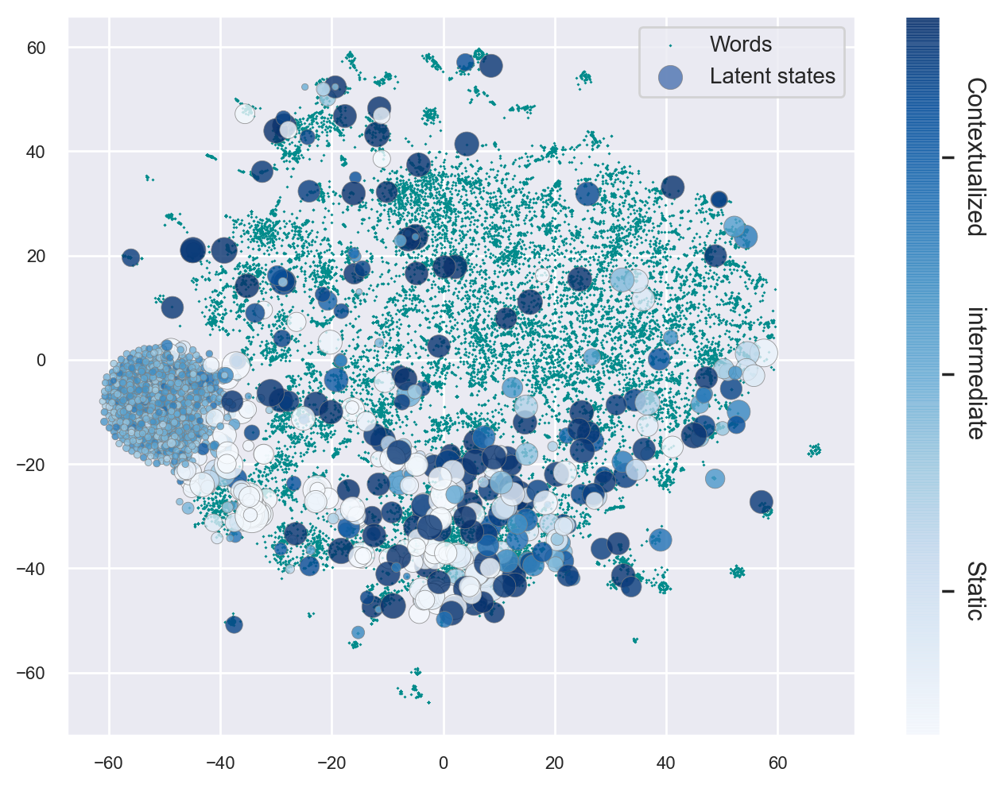

In [530]:
plot_state_non_stop(emb_background_perp_5, state_matrix_transform_perp_5, state_nonstop_freq_r, state_freq_norm)

## Plot all words + top 500 states -- 这应该是比较推荐的

Not very good because states are not balanced

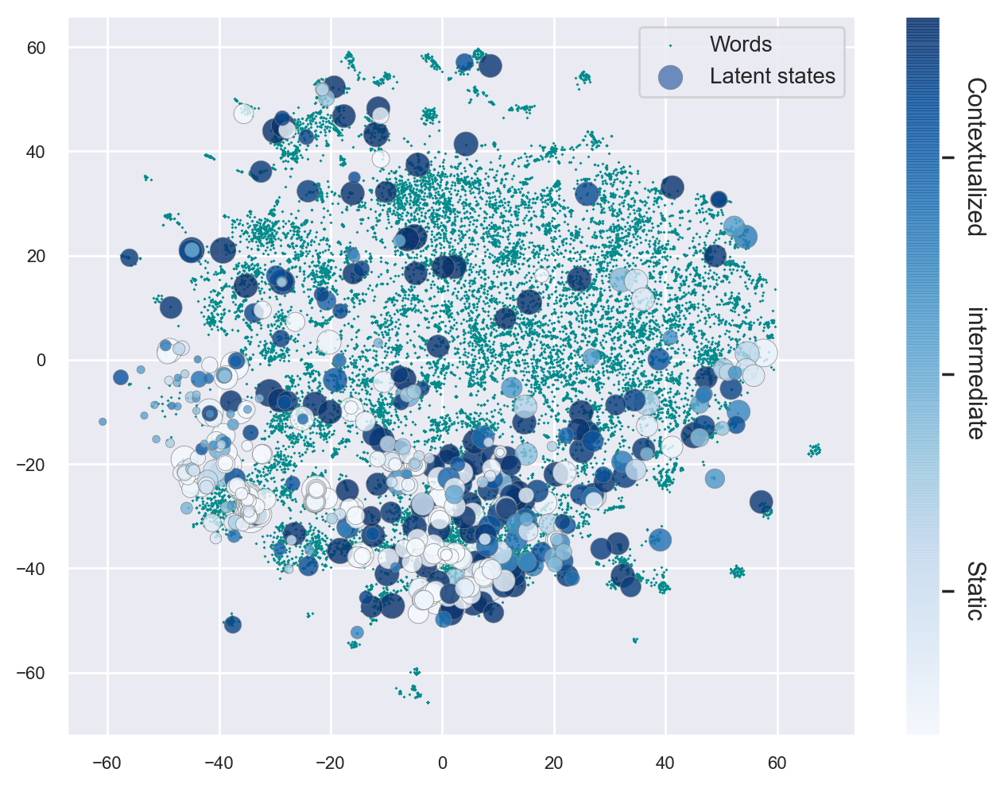

In [531]:
topk = 500
state_matrix_ = state_matrix_transform_perp_5[freq_idx_sort][:topk]
state_nonstop_freq_r_ = state_nonstop_freq_r[freq_idx_sort][:topk]
state_freq_norm_ = state_freq_norm[freq_idx_sort][:topk]
plot_state_non_stop(emb_background_perp_5, state_matrix_, state_nonstop_freq_r_, state_freq_norm_)

# tSNE, a sampled portion of nonstop words + top500 states

## 不考虑 state 之间的距离

In [583]:
sample_size = 8000
sample_idx = np.random.choice(len(emb_non_stop), sample_size, replace=False)
emb_non_stop_choice = emb_non_stop[sample_idx].cpu().numpy()

topk = 500
state_matrix_ = state_matrix.cpu().numpy()[freq_idx_sort][:topk]

embeddings_vis = tsne_preprocess(state_matrix_, emb_non_stop_choice)

In [590]:
emb_background_perp_5, state_matrix_transform_perp_5 = tsne_transform_dot_prod_no_state(embeddings_vis, 5, 1000, 500)

/home/s1946695/miniconda3/envs/_dl_py36_dev/lib/python3.6/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 8500 samples in 0.006s...
[t-SNE] Computed neighbors for 8500 samples in 1149.361s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8500
[t-SNE] Computed conditional probabilities for sample 2000 / 8500
[t-SNE] Computed conditional probabilities for sample 3000 / 8500
[t-SNE] Computed conditional probabilities for sample 4000 / 8500
[t-SNE] Computed conditional probabilities for sample 5000 / 8500
[t-SNE] Computed conditional probabilities for sample 6000 / 8500
[t-SNE] Computed conditional probabilities for sample 7000 / 8500
[t-SNE] Computed conditional probabilities for sample 8000 / 8500
[t-SNE] Computed conditional probabilities for sample 8500 / 8500
[t-SNE] Mean sigma: 0.000000
[t-SNE] Computed conditional probabilities in 3.293s
[t-SNE] Iteration 50: error = 100.8359451, gradient norm = 0.0017564 (50 iterations in 24.488s)
[t-SNE] Iteration 100: error = 97.8400192, gradient norm = 0.0036921 (50 iterations 

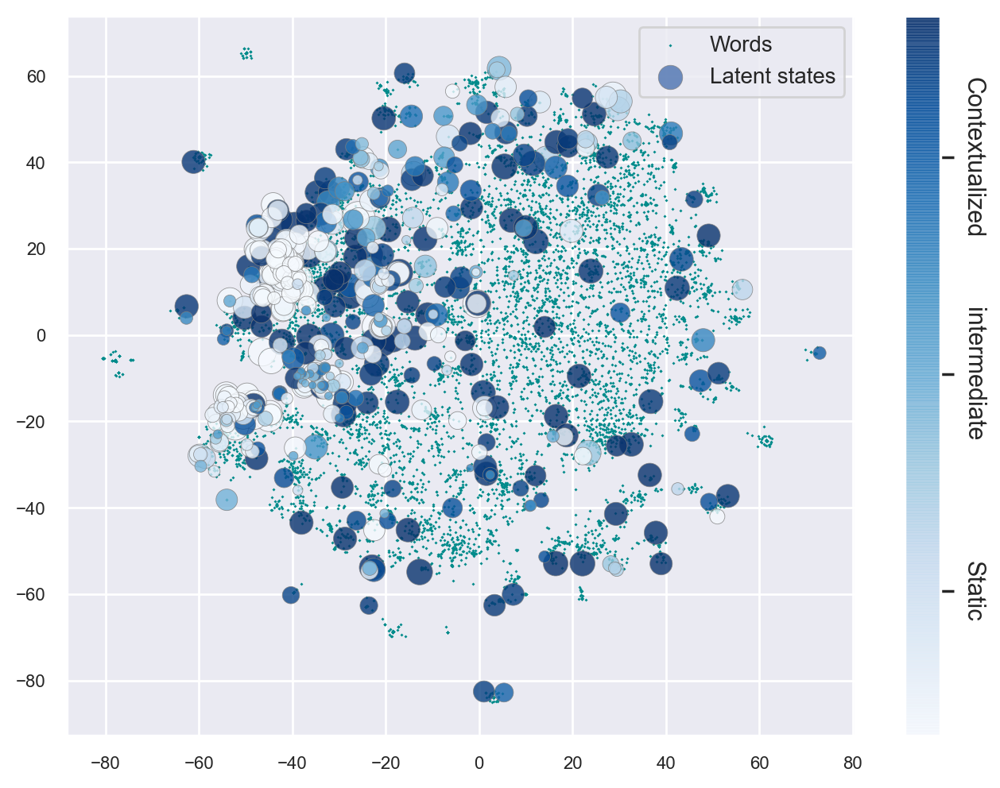

In [592]:
# state_matrix_ = state_matrix_transform_perp_5[freq_idx_sort][:topk]
state_nonstop_freq_r_ = state_nonstop_freq_r[freq_idx_sort][:topk]
state_freq_norm_ = state_freq_norm[freq_idx_sort][:topk]
plot_state_non_stop(emb_background_perp_5, state_matrix_transform_perp_5, state_nonstop_freq_r_, state_freq_norm_)

### 只画词，使用 word frequency 来 color

100%|██████████| 8000/8000 [00:00<00:00, 256289.39it/s]


8


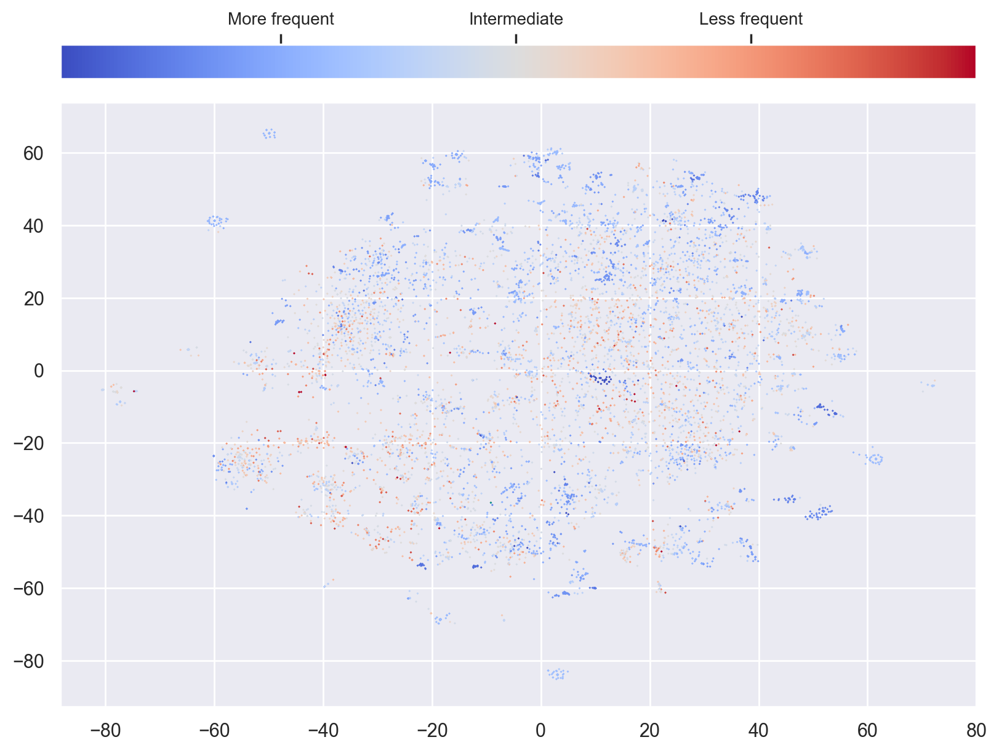

In [712]:
state_nonstop_freq_r_ = state_nonstop_freq_r[freq_idx_sort][:topk]
state_freq_norm_ = state_freq_norm[freq_idx_sort][:topk]
word_freq_norm_ = get_word_sample_freq(sample_idx, word_freq_norm, id2word, emb_non_stop_ids)
plot_state_non_stop_test(emb_background_perp_5, 
                    state_matrix_transform_perp_5, 
                    state_nonstop_freq_r_, 
                    state_freq_norm_, 
                    word_sample_freq=word_freq_norm_, 
                    word_only=True, 
                    state_size_base=0.3
                    )

### 只画词，使用每个词对应 state 的数量来 color

100%|██████████| 8000/8000 [00:00<00:00, 293811.36it/s]


752


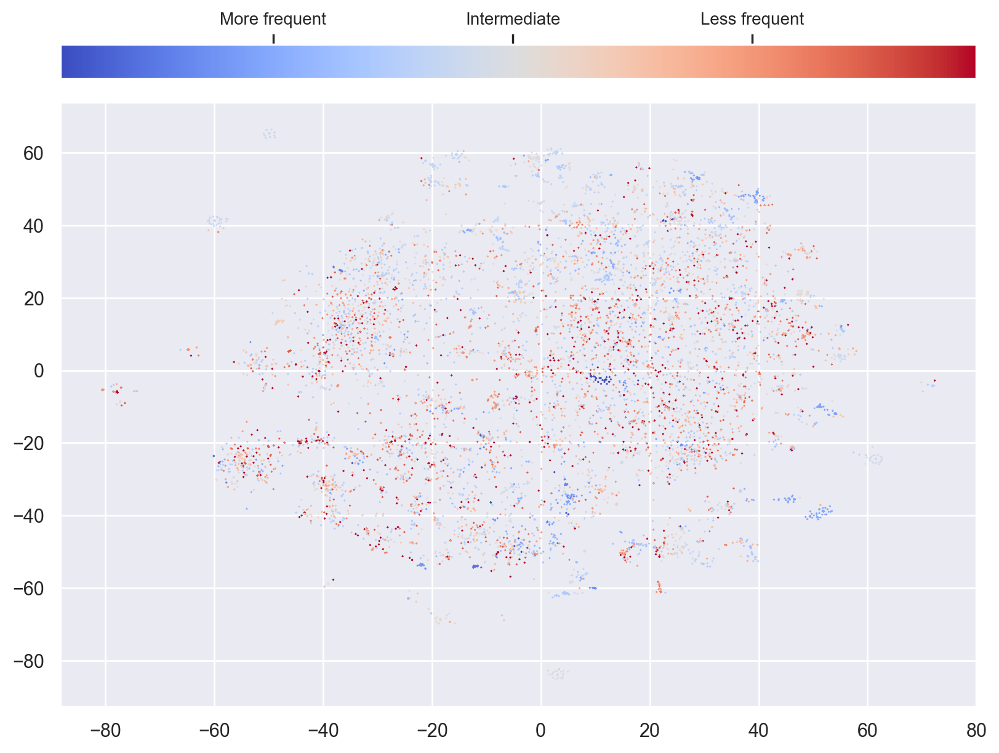

In [713]:
state_nonstop_freq_r_ = state_nonstop_freq_r[freq_idx_sort][:topk]
state_freq_norm_ = state_freq_norm[freq_idx_sort][:topk]
word_sample_freq_ = get_word_sample_freq(sample_idx, word_state_freq_norm, id2word, emb_non_stop_ids)
plot_state_non_stop_test(emb_background_perp_5, 
                    state_matrix_transform_perp_5, 
                    state_nonstop_freq_r_, 
                    state_freq_norm_, 
                    word_sample_freq=word_sample_freq_, 
                    word_only=True, 
                    state_size_base=0.3
                    )

### State 和 word 同时画出来， word 用 frequency 来 color 

#### 所有 state

100%|██████████| 8000/8000 [00:00<00:00, 328115.78it/s]


8


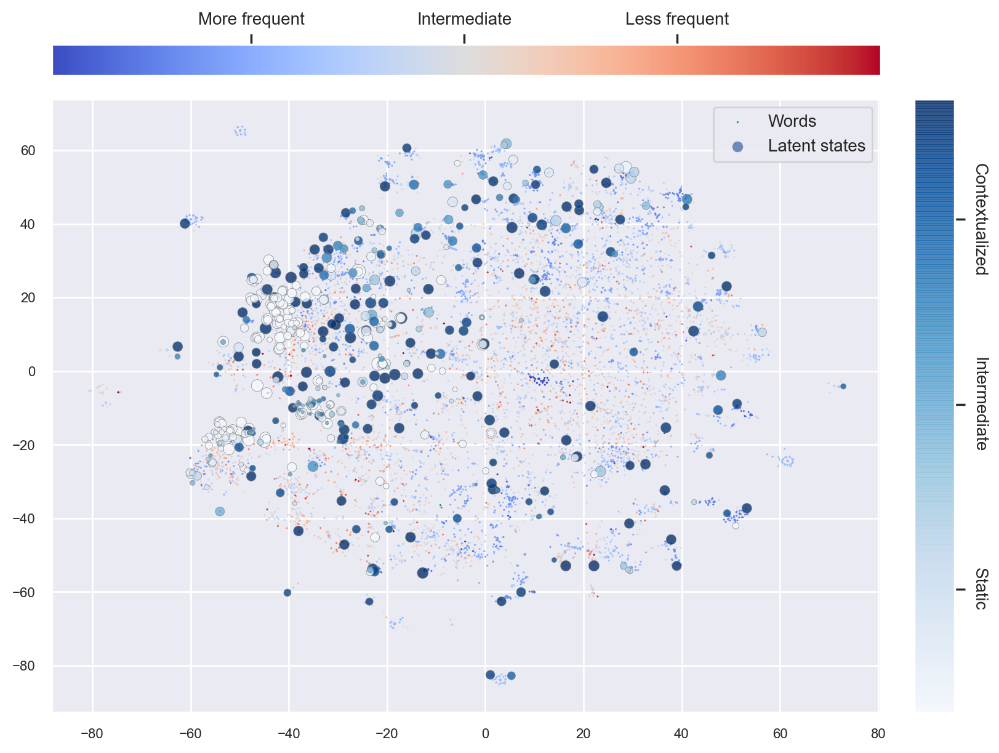

In [714]:
# state_matrix_ = state_matrix_transform_perp_5[freq_idx_sort][:topk]
state_nonstop_freq_r_ = state_nonstop_freq_r[freq_idx_sort][:topk]
state_freq_norm_ = state_freq_norm[freq_idx_sort][:topk]
word_freq_norm_ = get_word_sample_freq(sample_idx, word_freq_norm, id2word, emb_non_stop_ids)
plot_state_non_stop_test(emb_background_perp_5, 
                    state_matrix_transform_perp_5, 
                    state_nonstop_freq_r_, 
                    state_freq_norm_, 
                    word_sample_freq=word_freq_norm_, 
                    word_only=False, 
                    state_size_base=0.3
                    )

#### Query 两个 state -- 这个现在还不大行

In [732]:
state_word_list = build_state_word_list([1236], freq_idx_sort, sim_word_state, id2word, wordid2sentid, emb_non_stop_ids, sample_idx)

NameError: name 'build_state_word_list' is not defined

#### Static state

100%|██████████| 8000/8000 [00:00<00:00, 352914.79it/s]


8


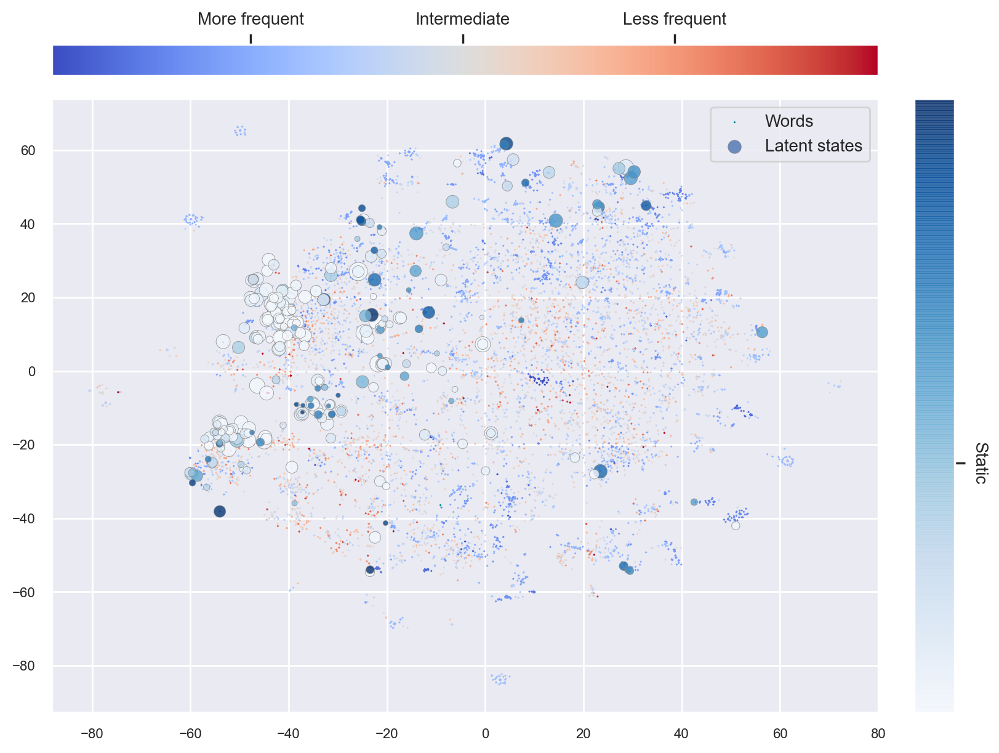

In [715]:
# state_matrix_ = state_matrix_transform_perp_5[freq_idx_sort][:topk]
state_nonstop_freq_r_ = state_nonstop_freq_r[freq_idx_sort][:topk]
state_freq_norm_ = state_freq_norm[freq_idx_sort][:topk]
word_freq_norm_ = get_word_sample_freq(sample_idx, word_freq_norm, id2word, emb_non_stop_ids)
plot_state_non_stop_test(emb_background_perp_5, 
                    state_matrix_transform_perp_5, 
                    state_nonstop_freq_r_, 
                    state_freq_norm_, 
                    word_sample_freq=word_freq_norm_, 
                    word_only=False, 
                    state_size_base=0.5,
                    filter_static=True
                    )

#### Contextualized State

100%|██████████| 8000/8000 [00:00<00:00, 321276.43it/s]


8


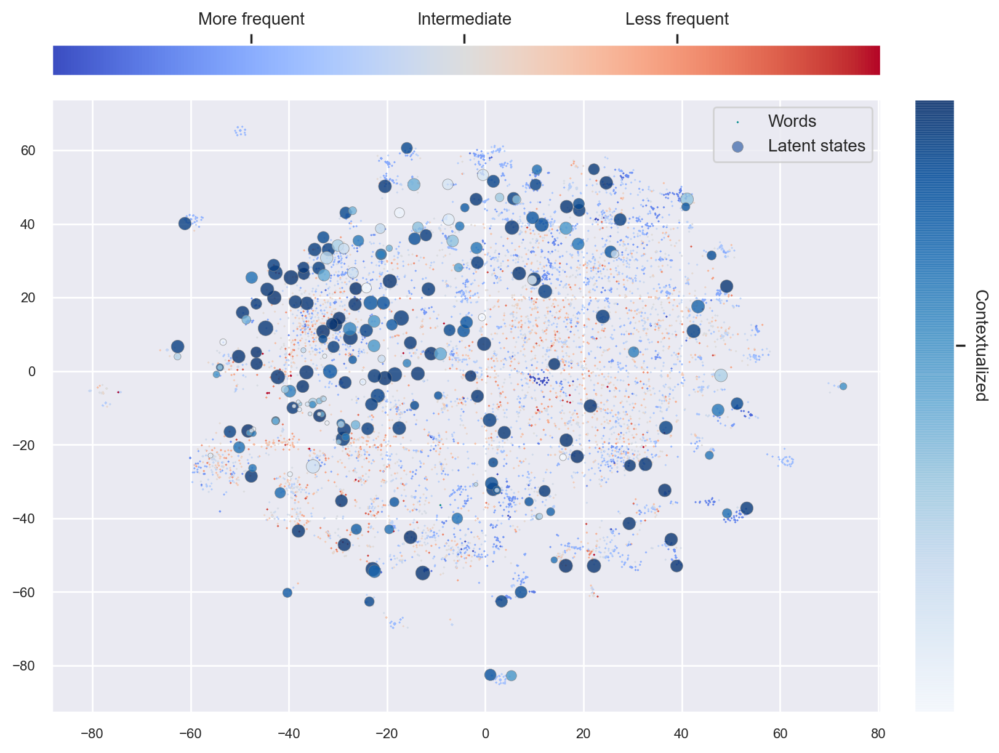

In [716]:
# state_matrix_ = state_matrix_transform_perp_5[freq_idx_sort][:topk]
state_nonstop_freq_r_ = state_nonstop_freq_r[freq_idx_sort][:topk]
state_freq_norm_ = state_freq_norm[freq_idx_sort][:topk]
word_freq_norm_ = get_word_sample_freq(sample_idx, word_freq_norm, id2word, emb_non_stop_ids)
plot_state_non_stop_test(emb_background_perp_5, 
                    state_matrix_transform_perp_5, 
                    state_nonstop_freq_r_, 
                    state_freq_norm_, 
                    word_sample_freq=word_freq_norm_, 
                    word_only=False, 
                    state_size_base=0.5,
                    filter_contextualized=True
                    )

### State 和 word 同时画出来，word 使用对应 state 的数量来 color 

#### 所有 state

100%|██████████| 8000/8000 [00:00<00:00, 158505.90it/s]


752


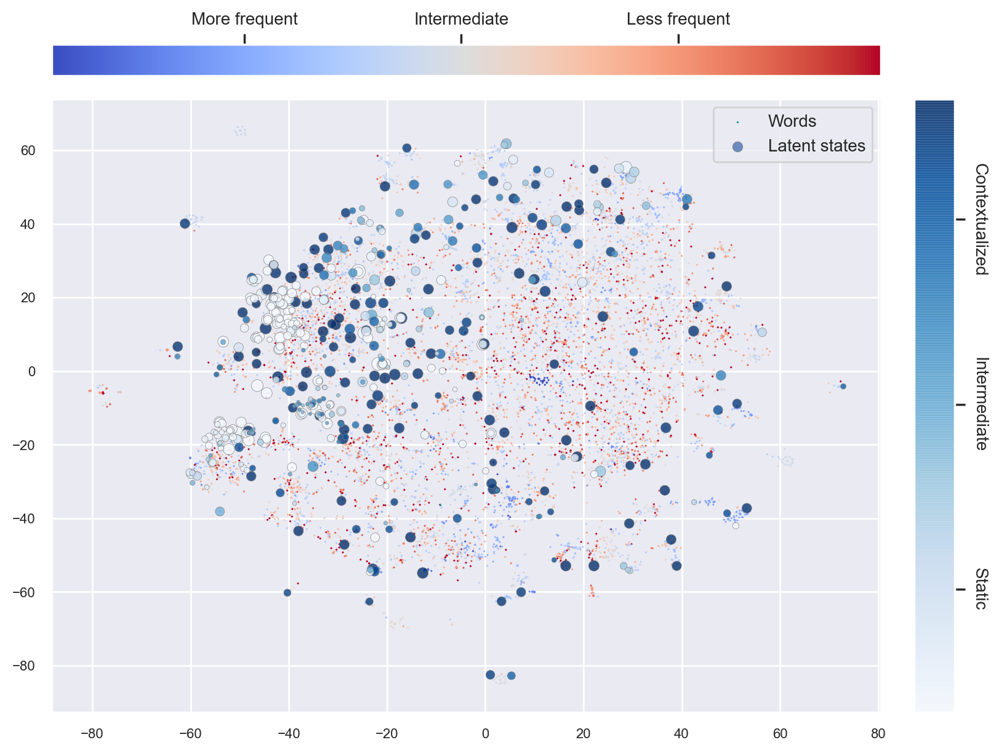

In [717]:
state_nonstop_freq_r_ = state_nonstop_freq_r[freq_idx_sort][:topk]
state_freq_norm_ = state_freq_norm[freq_idx_sort][:topk]
word_freq_norm_ = get_word_sample_freq(sample_idx, word_state_freq_norm, id2word, emb_non_stop_ids)
plot_state_non_stop_test(emb_background_perp_5, 
                    state_matrix_transform_perp_5, 
                    state_nonstop_freq_r_, 
                    state_freq_norm_, 
                    word_sample_freq=word_freq_norm_, 
                    word_only=False, 
                    state_size_base=0.3
                    )

#### State state

100%|██████████| 8000/8000 [00:00<00:00, 257918.57it/s]


752


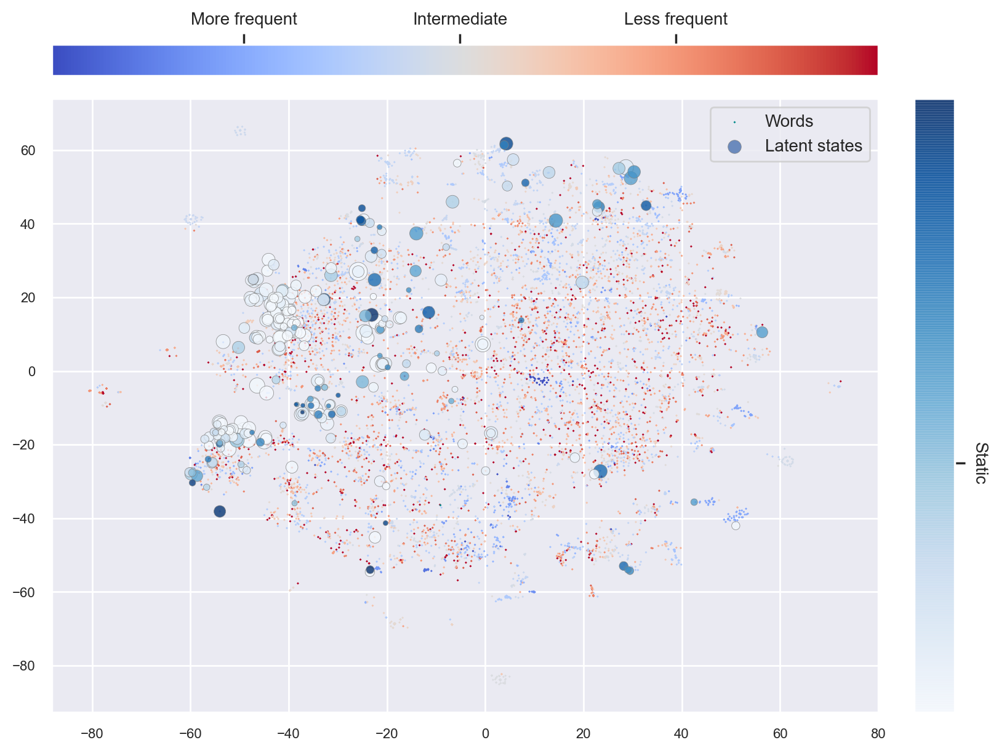

In [722]:
state_nonstop_freq_r_ = state_nonstop_freq_r[freq_idx_sort][:topk]
state_freq_norm_ = state_freq_norm[freq_idx_sort][:topk]
word_freq_norm_ = get_word_sample_freq(sample_idx, word_state_freq_norm, id2word, emb_non_stop_ids)
plot_state_non_stop_test(emb_background_perp_5, 
                    state_matrix_transform_perp_5, 
                    state_nonstop_freq_r_, 
                    state_freq_norm_, 
                    word_sample_freq=word_freq_norm_, 
                    word_only=False, 
                    state_size_base=0.5,
                    filter_static=True
                    )

#### Contextualized State

100%|██████████| 8000/8000 [00:00<00:00, 264337.17it/s]


752


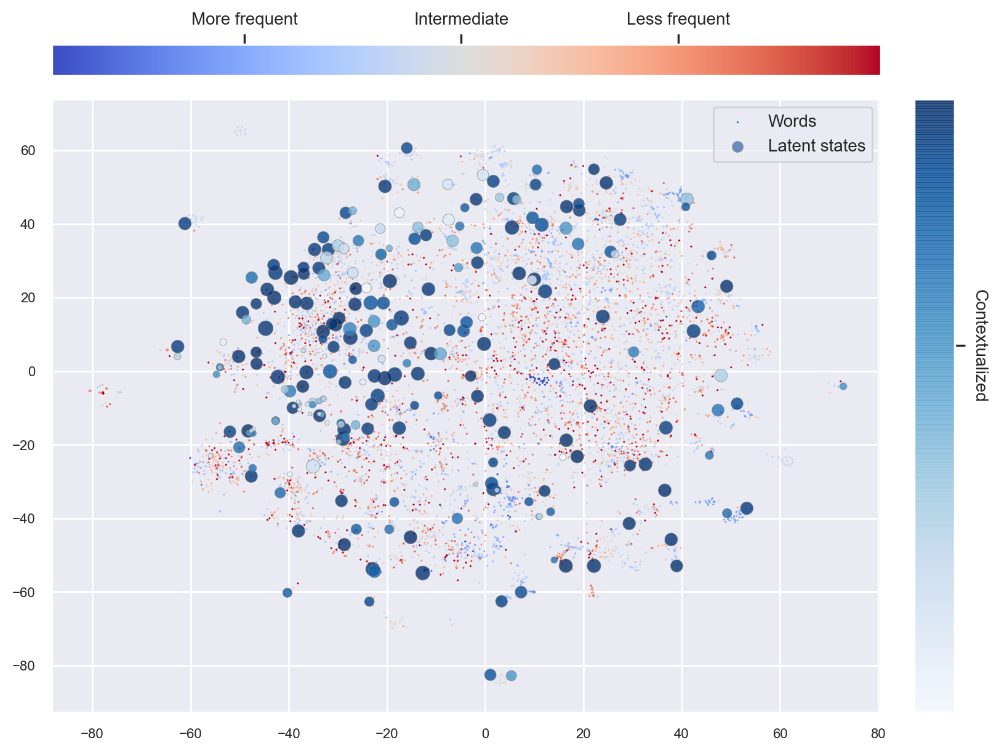

In [721]:
state_nonstop_freq_r_ = state_nonstop_freq_r[freq_idx_sort][:topk]
state_freq_norm_ = state_freq_norm[freq_idx_sort][:topk]
word_freq_norm_ = get_word_sample_freq(sample_idx, word_state_freq_norm, id2word, emb_non_stop_ids)
plot_state_non_stop_test(emb_background_perp_5, 
                    state_matrix_transform_perp_5, 
                    state_nonstop_freq_r_, 
                    state_freq_norm_, 
                    word_sample_freq=word_freq_norm_, 
                    word_only=False, 
                    state_size_base=0.5,
                    filter_contextualized=True
                    )

## 考虑 state 之间的距离 -- 这就不可以了，因为所有的 states 都挤在一起了 -- 放弃这部分

/home/s1946695/miniconda3/envs/_dl_py36_dev/lib/python3.6/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 8500 samples in 0.010s...
[t-SNE] Computed neighbors for 8500 samples in 471.708s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8500
[t-SNE] Computed conditional probabilities for sample 2000 / 8500
[t-SNE] Computed conditional probabilities for sample 3000 / 8500
[t-SNE] Computed conditional probabilities for sample 4000 / 8500
[t-SNE] Computed conditional probabilities for sample 5000 / 8500
[t-SNE] Computed conditional probabilities for sample 6000 / 8500
[t-SNE] Computed conditional probabilities for sample 7000 / 8500
[t-SNE] Computed conditional probabilities for sample 8000 / 8500
[t-SNE] Computed conditional probabilities for sample 8500 / 8500
[t-SNE] Mean sigma: 0.000000
[t-SNE] Computed conditional probabilities in 1.663s
[t-SNE] Iteration 50: error = 99.1075897, gradient norm = 0.0976686 (50 iterations in 10.334s)
[t-SNE] Iteration 100: error = 97.5611267, gradient norm = 0.0603676 (50 iterations in

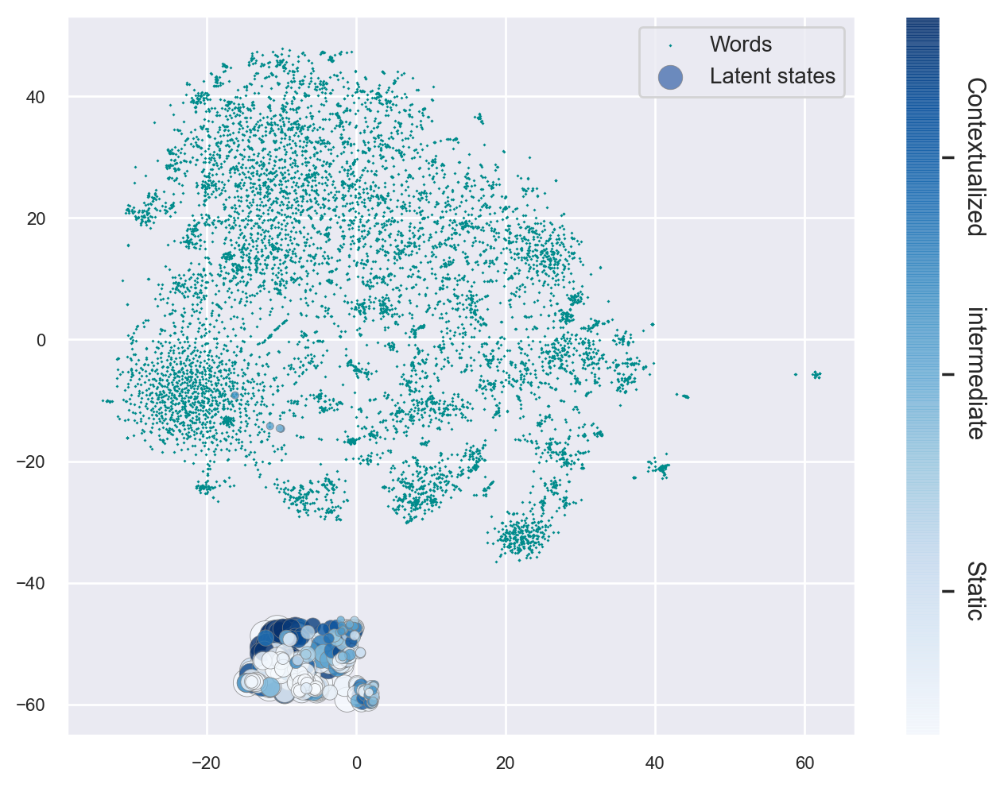

In [566]:
sample_size = 8000
sample_idx = np.random.choice(len(emb_non_stop), sample_size, replace=False)
emb_non_stop_choice = emb_non_stop[sample_idx].cpu().numpy()

topk = 500
state_matrix_ = state_matrix.cpu().numpy()[freq_idx_sort][:topk]

embeddings_vis = np.concatenate([state_matrix_, emb_non_stop_choice], 0)

state_nonstop_freq_r_ = state_nonstop_freq_r[freq_idx_sort][:topk]
state_freq_norm_ = state_freq_norm[freq_idx_sort][:topk]
emb_background_perp_5, state_matrix_transform_perp_5 = tsne_transform_dot_prod(embeddings_vis, 5, 1000, 500)
plot_state_non_stop(emb_background_perp_5, state_matrix_transform_perp_5, state_nonstop_freq_r_, state_freq_norm_)

# Optimization: stop words + nonstop words + states

Plot all words as background and plot states and state transition

In [ ]:
# TODO: remove all stop words

emb_background = []
emb_bg_words = []


emb_dynamic_words = []
emb_dynamic = []

emb_static_words = []
emb_static = []

emb_cls = []
emb_sep = []
for w, e in zip(tokens, emb_transform):
    emb_bg_words.append(w)
    emb_background.append(e)

    if(w in ['man', 'woman']): 
        emb_static.append(e)
        emb_static_words.append(w)
    elif(w == '[CLS]'): 
        emb_cls.append(e)
    elif(w == '[SEP]'):
        emb_sep.append(e)
    elif(w in ['of', 'is']):
        emb_dynamic.append(e)
        emb_dynamic_words.append(w)
            
emb_background = np.array(emb_background)
emb_cls = np.array(emb_cls)
emb_sep = np.array(emb_sep)
emb_dynamic = np.array(emb_dynamic)
emb_static = np.array(emb_static)
state_matrix_transform = emb_transform[:2000]

In [85]:
sns.set(rc={'figure.figsize':(8,8), 'figure.dpi': 200})
plt.rcParams["font.size"] = 3

In [49]:
plt.rcParams['figure.figsize'] = [4.0, 4.0]
plt.rcParams['figure.dpi'] = 300
plt.rcParams["font.family"] = "DejaVu Sans"

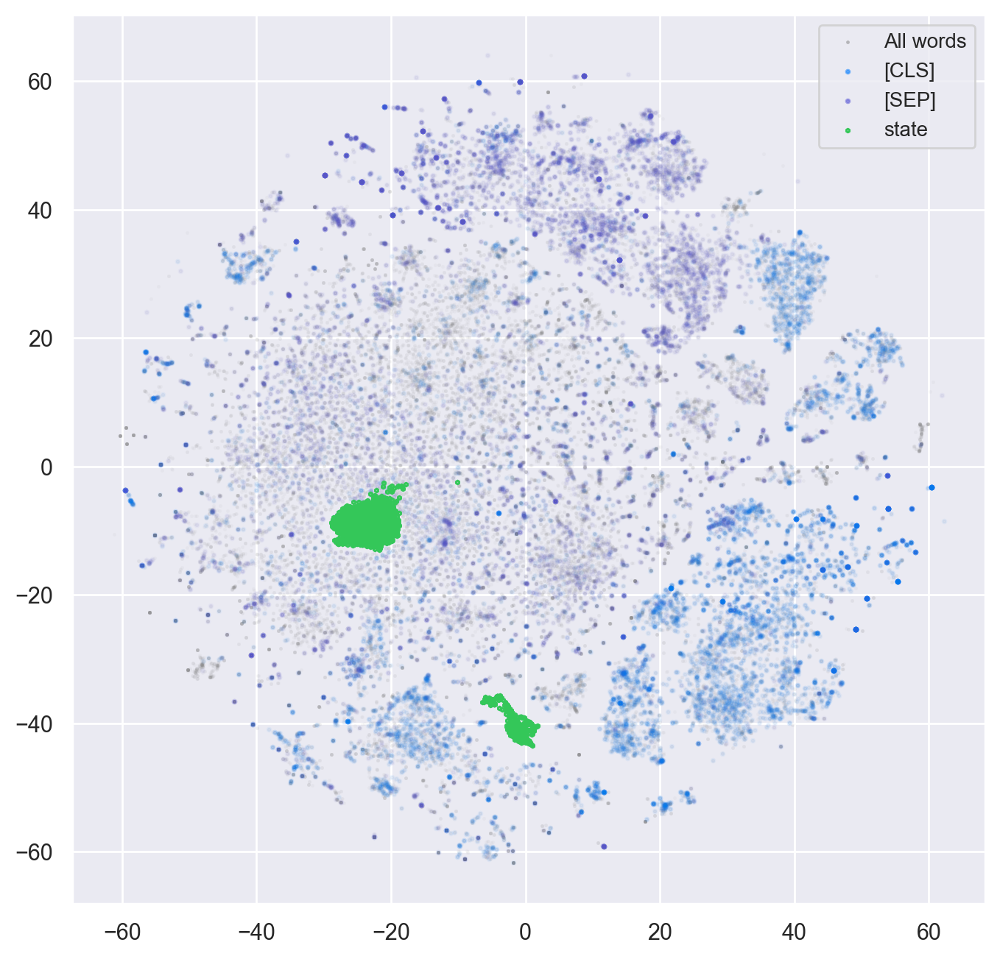

In [88]:
# colors = np.zeros((emb_vis.shape[0], 4))
# colors[:, 0] = 1.0
# colors[:, 3] = 0.1
s = 3
alpha=1.

# visualize all words as background
plt.scatter(x=emb_background[:, 0], y=emb_background[:, 1], s=s, color='0.5', alpha=0.05, linewidths=0)
# plt.scatter(x=emb_background[:, 0], y=emb_background[:, 1], s=s, color='0.5', alpha=0.05)
fig_all = plt.scatter(x=emb_background[0, 0], y=emb_background[0, 1], s=s, color='0.5', alpha=0.5, linewidths=0)

# CLS 
plt.scatter(x=emb_cls[:, 0], y=emb_cls[:, 1], s=s, color='#007bff', alpha=0.05, linewidths=1)
fig_cls = plt.scatter(x=emb_cls[0, 0], y=emb_cls[0, 1], s=s, color='#007bff', alpha=0.5, linewidths=1)

# SEP
plt.scatter(x=emb_sep[:, 0], y=emb_sep[:, 1], s=s, color='#5856d6', alpha=0.05, linewidths=1)
fig_sep = plt.scatter(x=emb_sep[0, 0], y=emb_sep[0, 1], s=s, color='#5856d6', alpha=0.5, linewidths=1)

# # is/ of
# plt.scatter(x=emb_dynamic[:, 0], y=emb_dynamic[:, 1], s=s, color='#ff3a30', alpha=0.8, linewidths=1)
# fig_dynamic = plt.scatter(x=emb_sep[0, 0], y=emb_sep[0, 1], s=s, color='#ff3a30', alpha=0.8, linewidths=1)

# man/ woman
# fig_static = plt.scatter(x=emb_static[:, 0], y=emb_static[:, 1], alpha=0.5, linewidth=4, s=50)
# fig_static = plt.scatter(x=emb_static[:, 0], y=emb_static[:, 1], s=s, color='#ff2d54', marker='o', alpha=0.6, linewidth=6, edgecolors='face')

# state
state_facecolor = np.array((52./255, 199./255, 89./255, 0.5))
state_edgecolor = np.array((52./255, 199./255, 89./255, 1.))
fig_state = plt.scatter(x=state_matrix_transform[:, 0], y=state_matrix_transform[:, 1], facecolors=state_facecolor, edgecolors=state_edgecolor, s=3, linewidths=1, marker='h')
# fig_state = plt.scatter(x=state_matrix[:, 0], y=state_matrix[:, 1], facecolors='none', edgecolors='tab:orange', s=40, linewidths=1, marker='h', alpha=1)
# fig_state = plt.scatter(x=state_matrix[:, 0], y=state_matrix[:, 1], color='tab:orange', marker='h', alpha=0.5)
# for si, sj in zip(near_state_from, near_state_to):
#     plt.plot([si[0], sj[0]], [si[1], sj[1]], color='tab:orange', linestyle=':')

# TODO: latent states and their connectivity

# plt.xlim([-5, 10])
# plt.ylim([-5, 7.5])

plt.legend((
    fig_all, 
    fig_cls, 
    fig_sep, 
# #     fig_static, 
#     fig_dynamic, 
    fig_state
    ), (
    'All words', 
    '[CLS]', 
    '[SEP]', 
#     'static:man/woman', 
#     'dynamic:is/of', 
    'state'
    ), fontsize=10)
# visualize all 
# visualize 
# plt.scatter(x=emb.x, y=emb.y, color=colors)
# g0 = sns.scatterplot(x="x", y="y", hue="token", style='word_type', data=emb[emb.word_type == 'static'], alpha=1)
# g1 = sns.scatterplot(x="x", y="y", hue="token", style='word_type', data=emb[emb.word_type == 'dynamic'], alpha=0.1)
# plt.legend(handles=[g0, g1])

**Why there are two clusters of the states?**

# tSNE, states only, top 500 most frequent states, distance based on vector product -- 这一部分新开一个笔记本

## Preparations

In [395]:
def tsne_transform_dot_prod_state(emb_matrix, perplexity, n_iter, topk):
    """Do tsne"""
    topk = 500
    embeddings_vis = torch.cat([emb_matrix], 0).cpu().numpy()[freq_idx_sort][:topk]

    tsne = TSNE(n_components=2, verbose=2, perplexity=10, n_iter=1000, metric=metric_fn)
    emb_transform = tsne.fit_transform(embeddings_vis)
    return emb_transform

def tsne_transform(state_matrix, perplexity, n_iter, topk):
    """Do tsne"""
    topk = 500
    embeddings_vis = torch.cat([state_matrix], 0).cpu().numpy()[freq_idx_sort][:topk]
    # embeddings_vis = PCA(n_components=100).fit_transform(embeddings_vis)

    tsne = TSNE(n_components=2, verbose=2, perplexity=10, n_iter=1000)
    emb_transform = tsne.fit_transform(embeddings_vis)
    return emb_transform

def tsne_vis_state(emb_transform, state_bigrams, n_edge, topk, alpha=1., draw_lines=True):
    """Visualize the states"""
    sns.set(rc={'figure.figsize':(7,5), 'figure.dpi': 200})
    plt.rcParams["font.size"] = 3

    fig, ax = plt.subplots()
    
    
    line_color = [255, 214, 52]
    line_colors = []
    lines = []
    if(draw_lines):
        for bi in state_bigrams[: n_edge]:
            i = freq_idx_inverse[bi[0]]
            j = freq_idx_inverse[bi[1]]
            a = bi[-1]
            if(i == j): continue
            if(i >= topk): continue
            if(j >= topk): continue

            x1 = emb_transform[i, 0]
            x2 = emb_transform[j, 0]
            y1 = emb_transform[i, 1]
            y2 = emb_transform[j, 1]
            lines.append([(x1, y1), (x2, y2)])
            line_colors.append((line_color[0] / 255., line_color[1] / 255., line_color[2]/255., alpha * a))
        lines = mc.LineCollection(lines, linewidths=0.5, colors=line_colors, alpha=alpha, linestyle='-.')
        ax.add_collection(lines)

    state_color = [0, 99, 204]
    state_edgecolor = np.array((state_color[0]/255., state_color[1]/255., state_color[2]/255., 1.))
    
    cmap = plt.cm.RdYlBu
    my_cmap = cmap(np.arange(cmap.N))
    my_cmap[:,-1] = 0.8
    my_cmap = ListedColormap(my_cmap)
    
    plot = ax.scatter(x=emb_transform[:, 0], 
               y=emb_transform[:, 1], 
               c=state_nonstop_freq_r[:topk], 
#                cmap='RdYlBu', 
               cmap=my_cmap, 
               edgecolors='black', 
               s=80 * state_freq_norm[:topk], 
               linewidths=0.3,
               zorder=2.5,
              )


    fig.colorbar(plot)
    x_ticks = plt.xticks(fontsize=8)
    y_ticks = plt.yticks(fontsize=8)
    return line_colors

In [366]:
emb_transform_perp_5 = tsne_transform_dot_prod_state(state_matrix, 5, 3000, 500)
emb_transform_perp_50 = tsne_transform_dot_prod_state(state_matrix, 50, 3000, 500)

/home/s1946695/miniconda3/envs/_dl_py36_dev/lib/python3.6/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 500 samples in 0.001s...
[t-SNE] Computed neighbors for 500 samples in 1.596s...
[t-SNE] Computed conditional probabilities for sample 500 / 500
[t-SNE] Mean sigma: 0.000016
[t-SNE] Computed conditional probabilities in 0.026s
[t-SNE] Iteration 50: error = 110.3181076, gradient norm = 0.3131662 (50 iterations in 0.288s)
[t-SNE] Iteration 100: error = 115.4712372, gradient norm = 0.3471663 (50 iterations in 0.260s)
[t-SNE] Iteration 150: error = 115.6417236, gradient norm = 0.3199566 (50 iterations in 0.261s)
[t-SNE] Iteration 200: error = 125.5349045, gradient norm = 0.2890136 (50 iterations in 0.262s)
[t-SNE] Iteration 250: error = 129.1680603, gradient norm = 0.3086260 (50 iterations in 0.263s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 129.168060
[t-SNE] Iteration 300: error = 3.7706256, gradient norm = 0.0066408 (50 iterations in 0.317s)
[t-SNE] Iteration 350: error = 2.6216397, gradient norm = 0.003

/home/s1946695/miniconda3/envs/_dl_py36_dev/lib/python3.6/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] Computed neighbors for 500 samples in 1.600s...
[t-SNE] Computed conditional probabilities for sample 500 / 500
[t-SNE] Mean sigma: 0.000016
[t-SNE] Computed conditional probabilities in 0.026s
[t-SNE] Iteration 50: error = 116.4735565, gradient norm = 0.2795025 (50 iterations in 0.284s)
[t-SNE] Iteration 100: error = 124.5693207, gradient norm = 0.3165648 (50 iterations in 0.284s)
[t-SNE] Iteration 150: error = 124.7805481, gradient norm = 0.2628399 (50 iterations in 0.263s)
[t-SNE] Iteration 200: error = 118.9347839, gradient norm = 0.2899613 (50 iterations in 0.278s)
[t-SNE] Iteration 250: error = 124.3750153, gradient norm = 0.2598672 (50 iterations in 0.315s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 124.375015
[t-SNE] Iteration 300: error = 3.9704499, gradient norm = 0.0042267 (50 iterations in 0.470s)
[t-SNE] Iteration 350: error = 3.4219887, gradient norm = 0.0010787 (50 iterations in 0.418s)
[t-SNE] Iteration 400: error = 3.3033679, gradient n

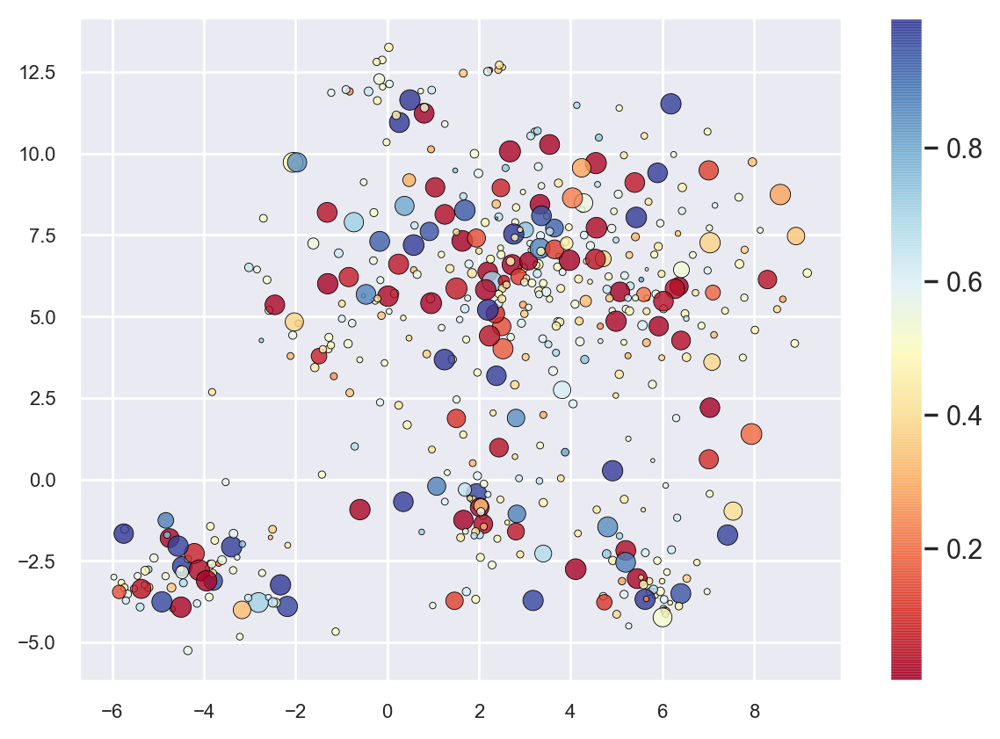

In [396]:
_ = tsne_vis_state(emb_transform_perp_5, state_bigram, n_edge=2000, topk=topk, alpha=0.2, draw_lines=False)

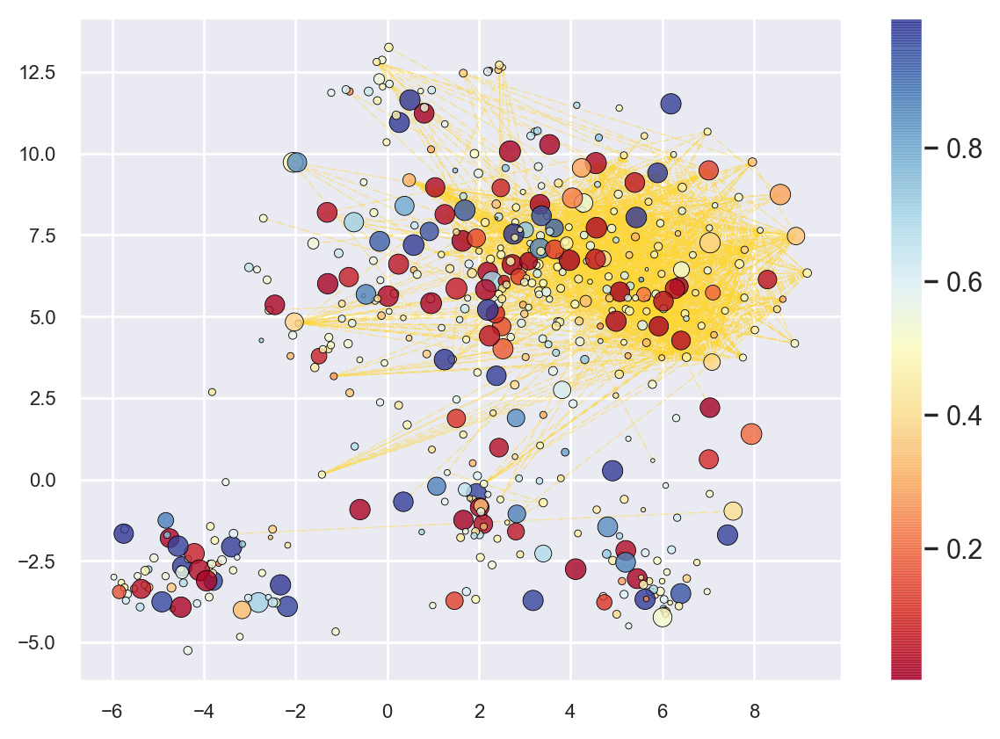

In [397]:
_ = tsne_vis_state(emb_transform_perp_5, state_bigram, n_edge=2000, topk=topk, alpha=0.5)

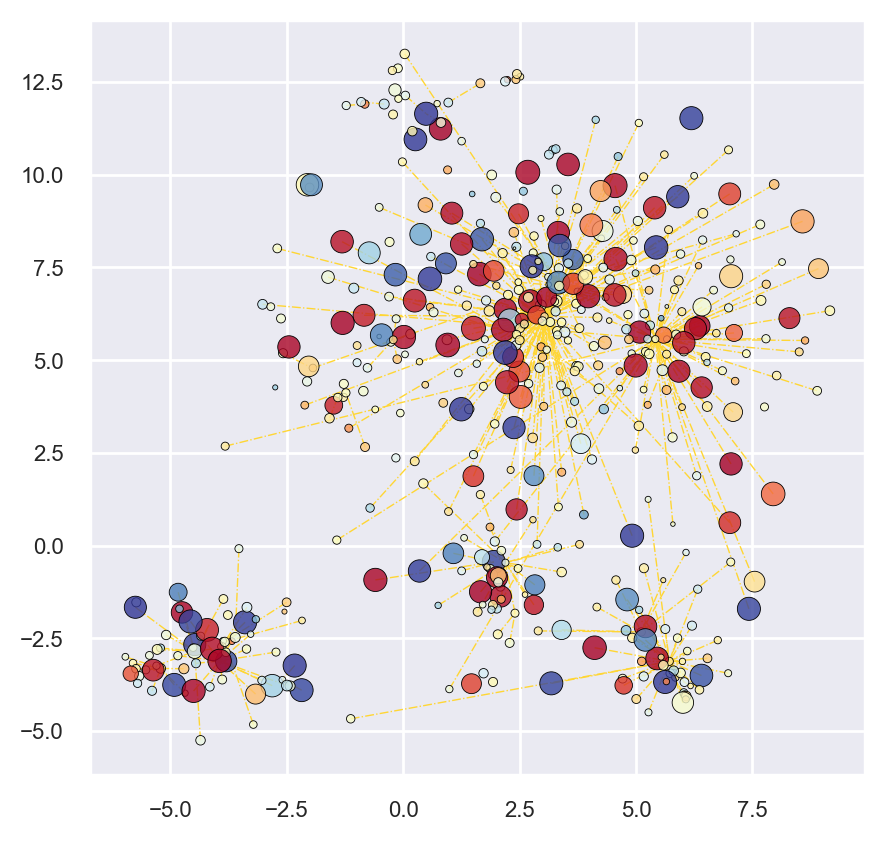

In [391]:
_ = tsne_vis_state(emb_transform_perp_5, state_bigram_dot_prod, n_edge=2000, topk=topk, alpha=1.)

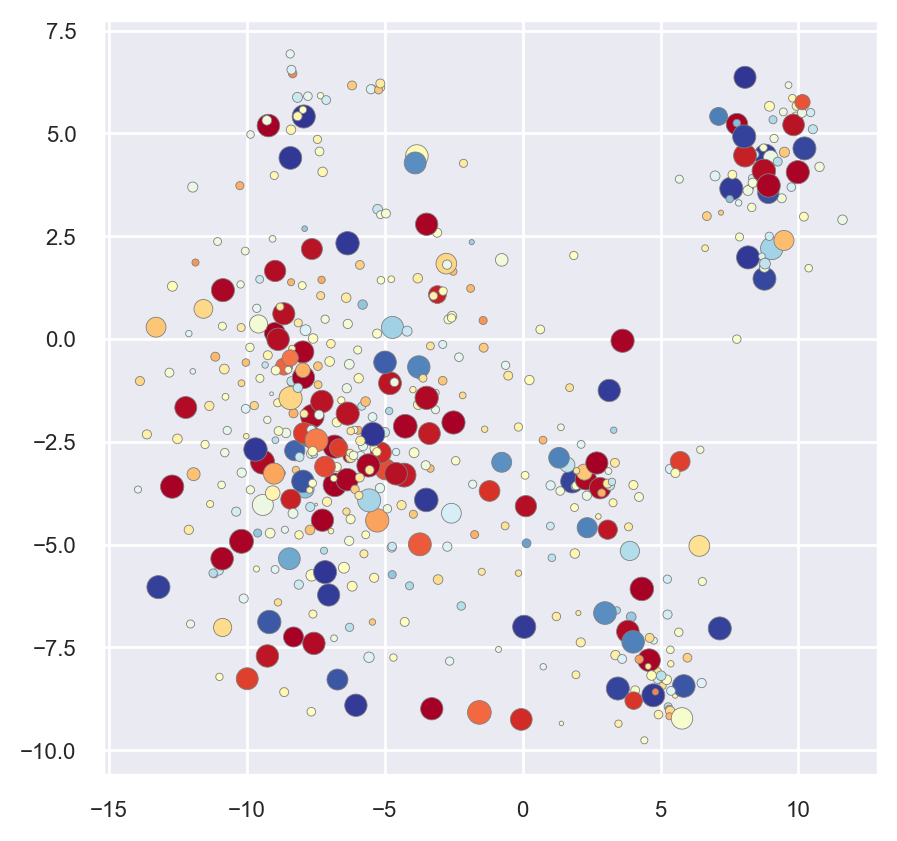

In [371]:
_ = tsne_vis_state(emb_transform_perp_50, state_bigram, n_edge=2000, topk=topk, alpha=0.2, draw_lines=False)

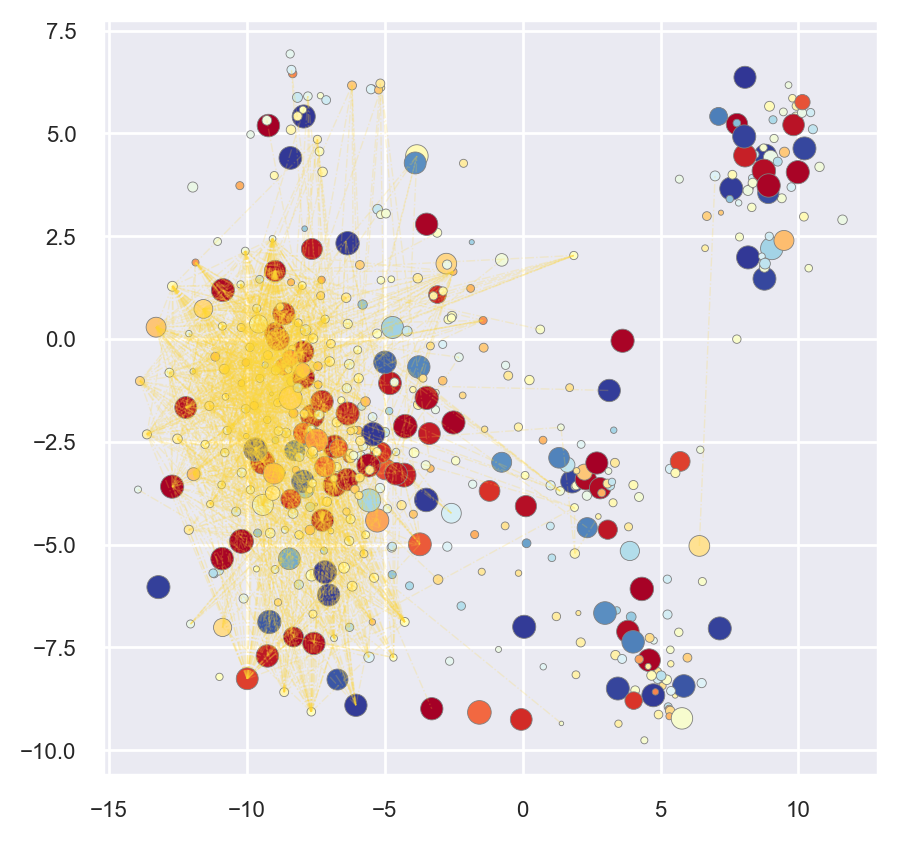

In [372]:
_ = tsne_vis_state(emb_transform_perp_50, state_bigram, n_edge=2000, topk=topk, alpha=0.2)

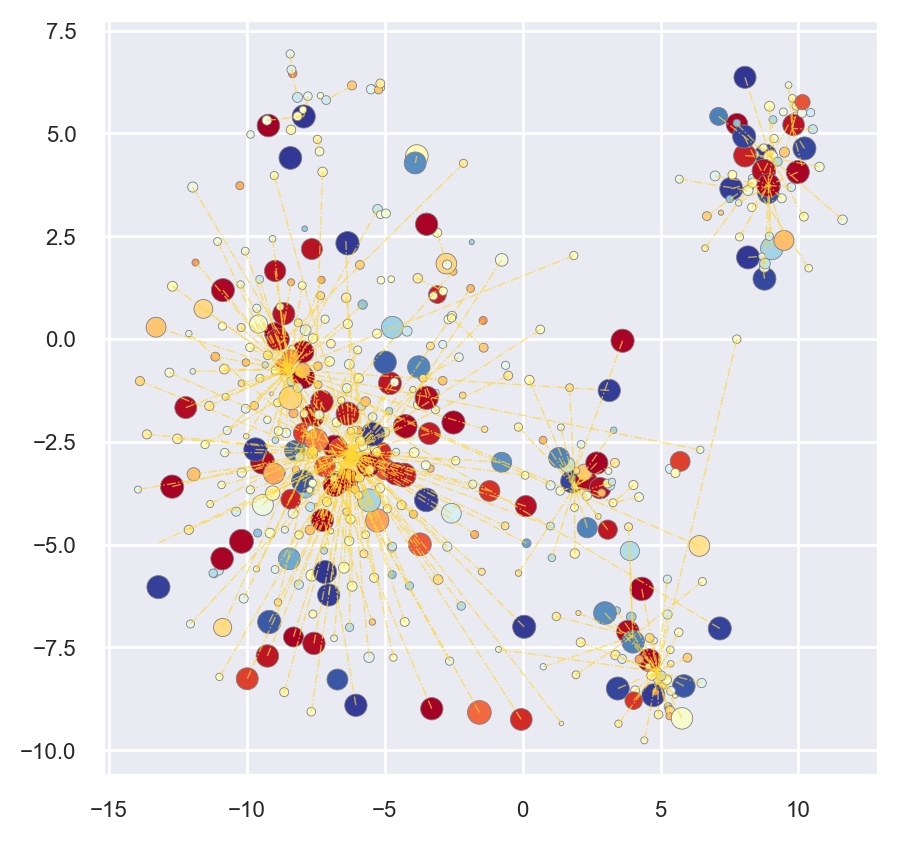

In [373]:
_ = tsne_vis_state(emb_transform_perp_50, state_bigram_dot_prod, n_edge=2000, topk=topk, alpha=0.7)

# tSNE, top 500 most frequent states, Euclidean distance

In [208]:
emb_transform_perp_5 = tsne_transform(state_matrix, 10, 1000, 500)
emb_transform_perp_10 = tsne_transform(state_matrix, 10, 1000, 500)
emb_transform_perp_20 = tsne_transform(state_matrix, 10, 1000, 500)
emb_transform_perp_35 = tsne_transform(state_matrix, 10, 1000, 500)
emb_transform_perp_50 = tsne_transform(state_matrix, 10, 1000, 500)

[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 500 samples in 0.001s...
[t-SNE] Computed neighbors for 500 samples in 0.040s...
[t-SNE] Computed conditional probabilities for sample 500 / 500
[t-SNE] Mean sigma: 0.659821
[t-SNE] Computed conditional probabilities in 0.014s
[t-SNE] Iteration 50: error = 78.4946136, gradient norm = 0.5005835 (50 iterations in 0.319s)
[t-SNE] Iteration 100: error = 80.0680389, gradient norm = 0.4748531 (50 iterations in 0.311s)
[t-SNE] Iteration 150: error = 79.2463989, gradient norm = 0.4621372 (50 iterations in 0.287s)
[t-SNE] Iteration 200: error = 79.3515778, gradient norm = 0.4864247 (50 iterations in 0.268s)
[t-SNE] Iteration 250: error = 77.2782211, gradient norm = 0.4908723 (50 iterations in 0.282s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 77.278221
[t-SNE] Iteration 300: error = 1.2573508, gradient norm = 0.0048521 (50 iterations in 0.239s)
[t-SNE] Iteration 350: error = 1.1274155, gradient norm = 0.0011092 (

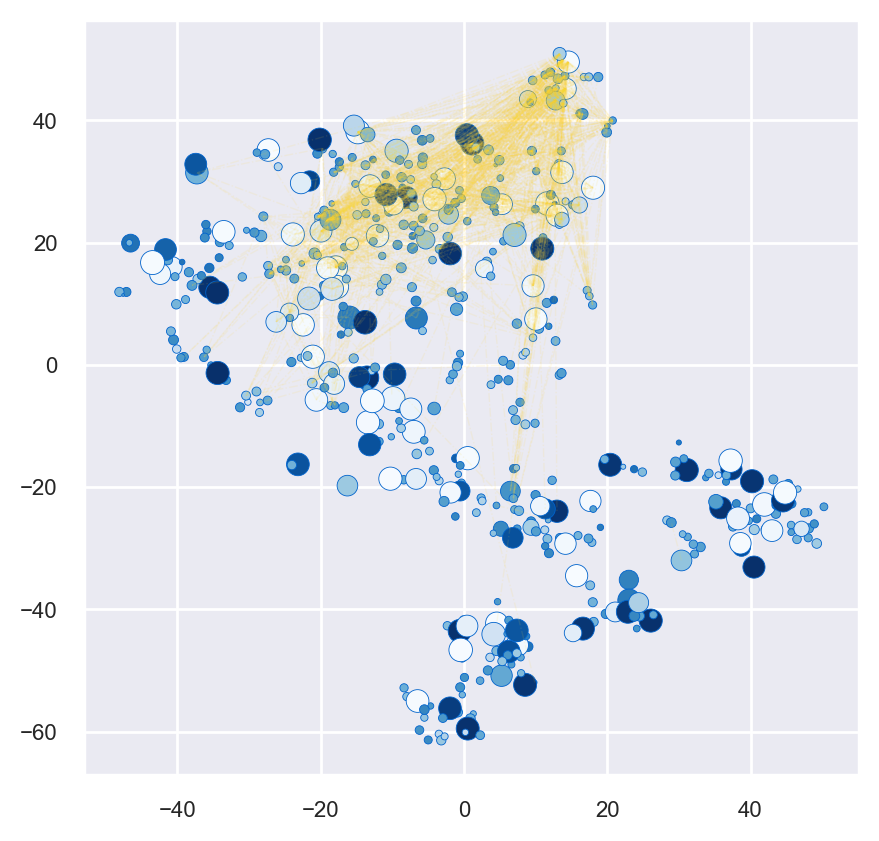

In [300]:
line_colors = tsne_vis_state(emb_transform_perp_5, state_bigram, n_edge=2000, topk=topk, alpha=0.1)

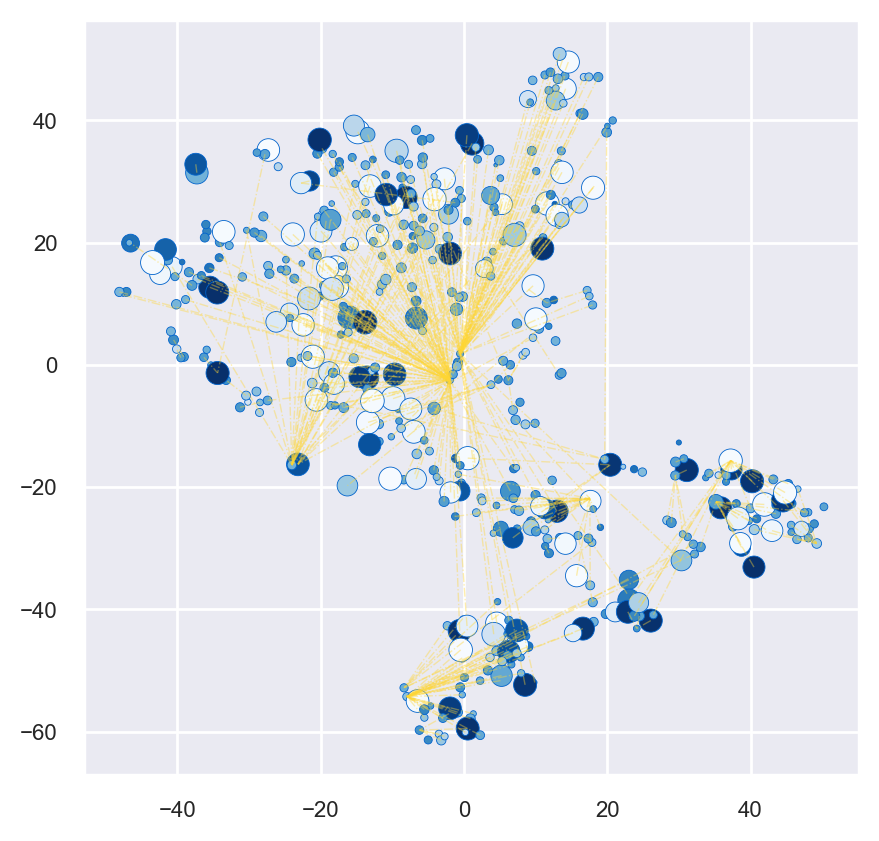

In [278]:
_ = tsne_vis_state(emb_transform_perp_5, state_bigram_dot_prod, n_edge=2000, topk=topk, alpha=0.4)

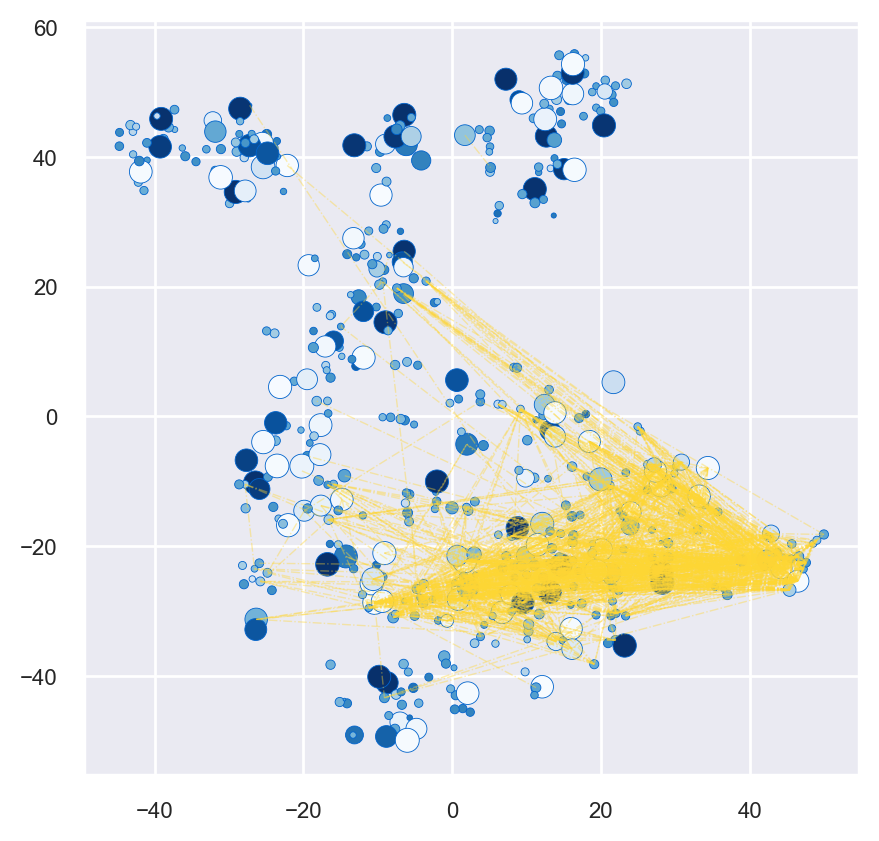

In [277]:
_ = tsne_vis_state(emb_transform_perp_10, state_bigram, 2000, topk, 0.4)

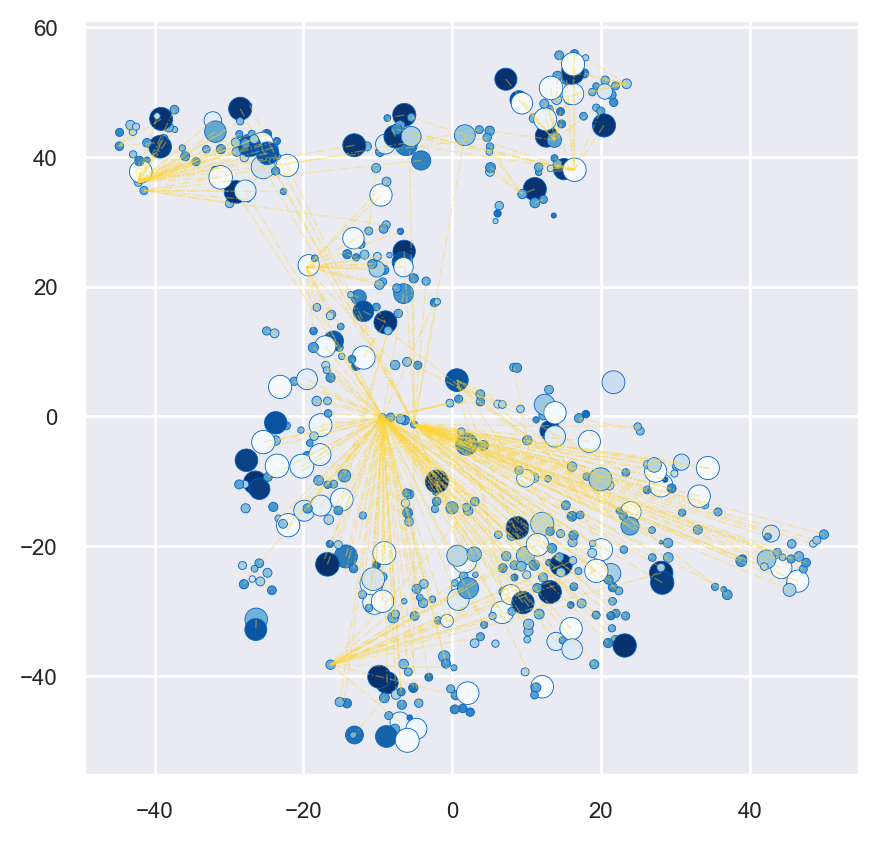

In [276]:
_ = tsne_vis_state(emb_transform_perp_10, state_bigram_dot_prod, 2000, topk, 0.4)

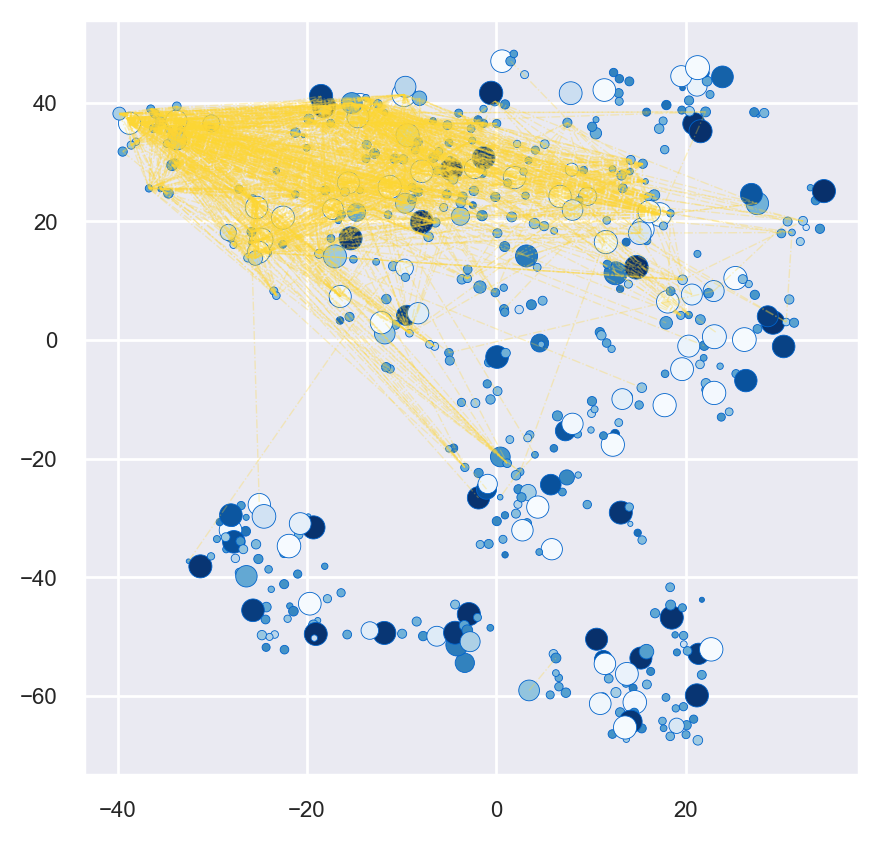

In [275]:
_ = tsne_vis_state(emb_transform_perp_20, state_bigram, 2000, topk, 0.3)

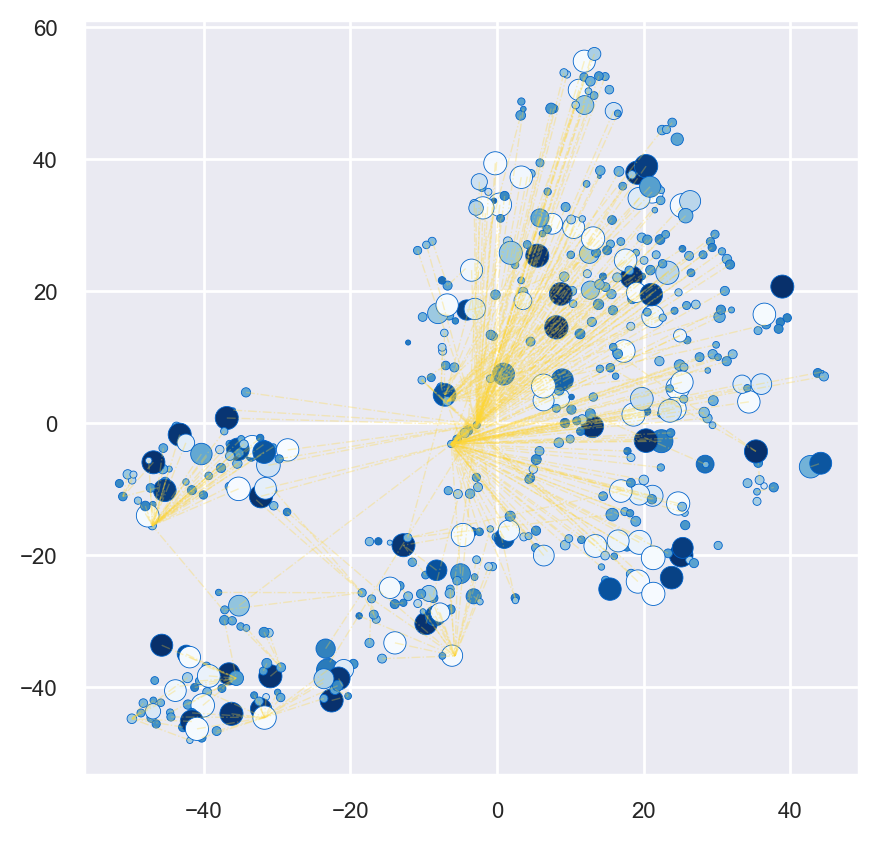

In [273]:
_ = tsne_vis_state(emb_transform_perp_35, state_bigram_dot_prod, 2000, topk, 0.3)

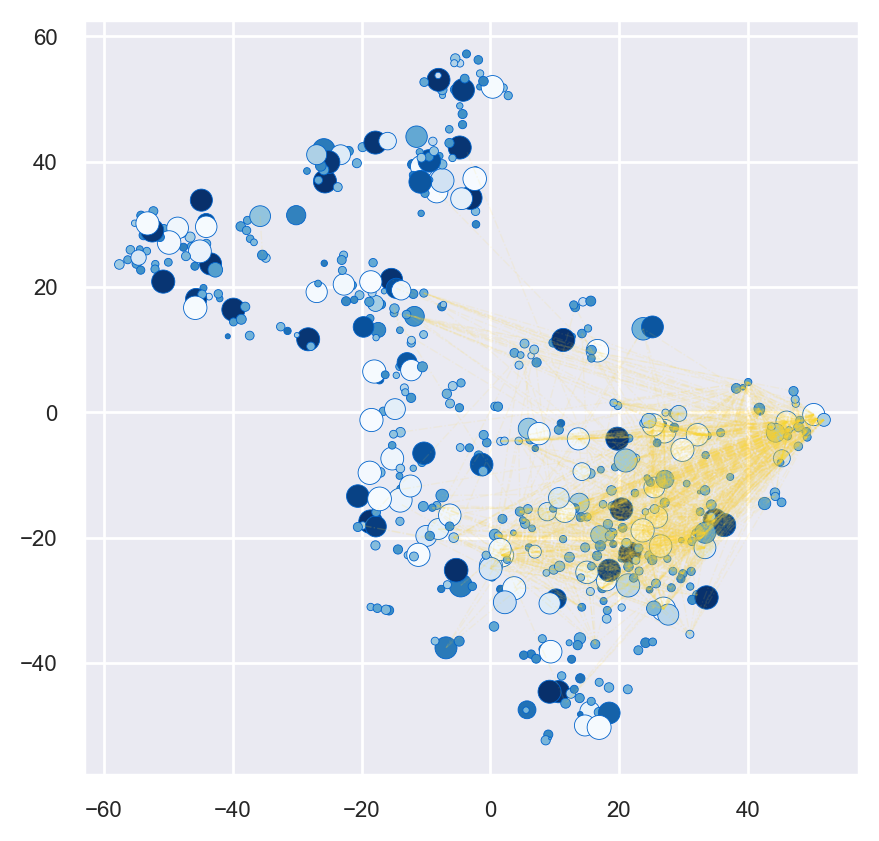

In [270]:
_ = tsne_vis_state(emb_transform_perp_50, state_bigram, n_edge=2000, topk=topk, alpha=0.1)

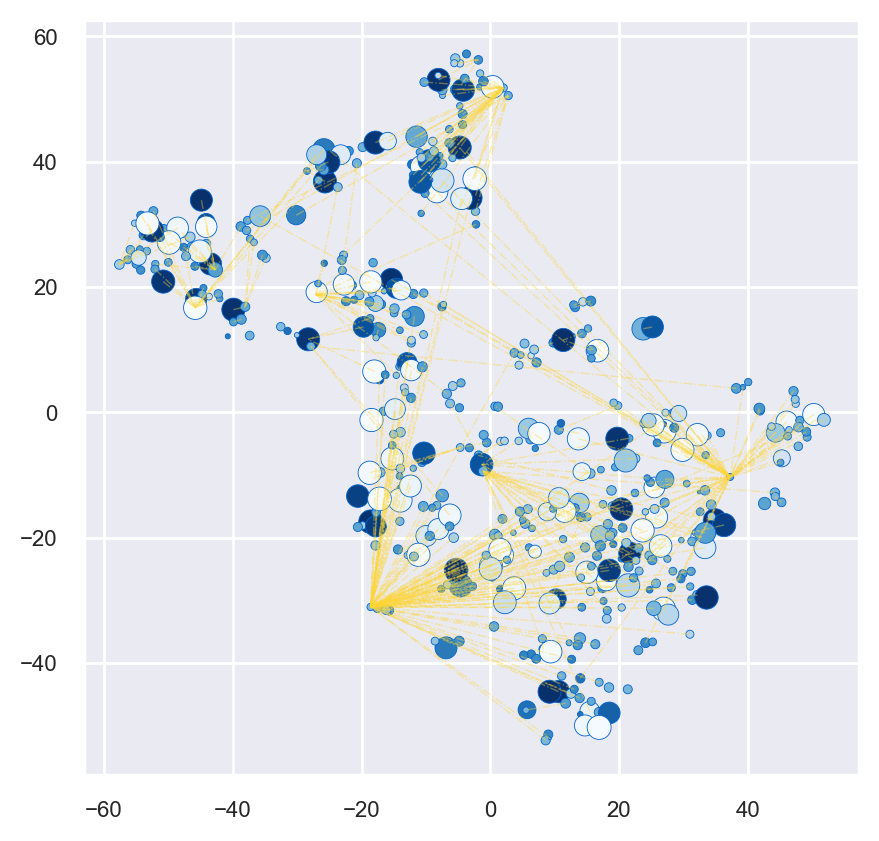

In [261]:
tsne_vis_state(emb_transform_perp_50, state_bigram_dot_prod, n_edge=2000, topk=topk, alpha=0.4)